In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

import random
import sys
import time
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.backend as keras_backend

from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import concatenate
from sklearn.feature_selection import mutual_info_regression
from numpy import asarray

In [ ]:
import math
def kl_divergence(p, q):
	return sum(p[i] * math.log((p[i]/q[i]),2) for i in range(len(p)))

# calculate the js divergence
def js_divergence(p, q):
	m = 0.5 * (p + q)
	return 0.5 * kl_divergence(p, m) + 0.5 * kl_divergence(q, m)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data =pd.read_csv("/content/drive/My Drive/Copy of all_Aug_2019.csv")
data2 = pd.read_csv("/content/drive/My Drive/prof-rnn-gd-b1.csv")

In [ ]:
data2 = data2.drop(data2.columns[[69]], axis =1)
data2 = data2.drop(data2.columns[[68]], axis =1)
data2 = data2.drop(data2.columns[[67]], axis =1)
data2 = data2.drop(data2.columns[[66]], axis =1)
data2 = data2.drop(data2.columns[[65]], axis =1)

In [ ]:
data2 = data2.drop(data2.columns[[64]], axis =1)

In [ ]:
data = data.dropna()
data2 = data2.dropna(axis=0)

In [ ]:
print(data2)

     Unnamed: 0  ...       ratio2
1             2  ...     0.000000
2             3  ...    16.435861
3             4  ...    37.749260
4             5  ...   114.065744
6             7  ...    39.285714
..          ...  ...          ...
128         129  ...     0.000000
129         130  ...     0.000000
132         133  ...     0.000000
133         134  ...  1050.000000
135         136  ...     0.000000

[99 rows x 64 columns]


In [ ]:
data = data.drop(data.columns[[9]], axis =1)
data2 = data2.drop(data2.columns[[0]], axis =1)

In [ ]:
print(data2)

                                            KernelName  ...       ratio2
1                                       BiasNHWCKernel  ...     0.000000
2    Cijk_Ailk_Bjlk_SB_MT64x64x8_SE_1LDSB0_APM1_AF0...  ...    16.435861
3    Cijk_Ailk_Bljk_SB_MT32x8x32_SE_1LDSB0_APM1_AF0...  ...    37.749260
4    Cijk_Alik_Bljk_SB_MT64x16x16_SE_1LDSB0_APM1_AF...  ...   114.065744
6                               CwiseFusedMulAddKernel  ...    39.285714
..                                                 ...  ...          ...
128  Cijk_Ailk_Bljk_SB_MT32x32x2_SE_1LDSB0_APM1_AF0...  ...     0.000000
129  Cijk_Alik_Bljk_SB_MT16x16x4_SE_1LDSB0_APM1_AF0...  ...     0.000000
132                                    EigenMetaKernel  ...     0.000000
133                       FillPhiloxRandomKernelLaunch  ...  1050.000000
135                         __amd_rocclr_fillBuffer.kd  ...     0.000000

[99 rows x 63 columns]


In [ ]:
uniqueValues = data2[data2.columns[0]].unique()
print('Unique elements in column "Atomics" ')
print(uniqueValues)

Unique elements in column "Atomics" 
['BiasNHWCKernel'
 'Cijk_Ailk_Bjlk_SB_MT64x64x8_SE_1LDSB0_APM1_AF0EM1_AF1EM1_AMAS3_ASBE01_ASCE01_ASEM1_BL1_DTL0_DVO0_EPS0_FL0_GRVW1_GSU1_ISA906_IU1_K1_KLA_LBSPP0_LPA0_LPB0_LDL1_LRVW4_MDA2_NLCA1_NLCB1_ONLL1_PBD0_PK0_PGR0_PLR1_RK0_SIA1_SU32_SUM0_SUS256_SRVW0_SVW4_SNLL0_TT4_4_TLDS0_USFGRO1_VAW1_VS1_VW4_WSGRA0_WSGRB0_WG16_16_1_WGM1.kd'
 'Cijk_Ailk_Bljk_SB_MT32x8x32_SE_1LDSB0_APM1_AF0EM1_AF1EM1_AMAS3_ASBE01_ASCE01_ASEM1_BL1_DTL0_DVO0_EPS1_FL1_GRVW2_GSU1_ISA906_IU1_K1_KLA_LBSPP0_LPA0_LPB2_LDL1_LRVW2_MDA2_NLCA1_NLCB1_ONLL1_PBD0_PK0_PGR1_PLR1_RK0_SIA1_SU32_SUM0_SUS256_SRVW0_SVW4_SNLL0_TT2_2_TLDS0_USFGRO0_VAW1_VS1_VW2_WSGRA0_WSGRB0_WG16_4_4_WGM1.kd'
 'Cijk_Alik_Bljk_SB_MT64x16x16_SE_1LDSB0_APM1_AF0EM1_AF1EM1_AMAS3_ASBE01_ASCE01_ASEM1_BL1_DTL0_DVO0_EPS1_FL0_GRVW4_GSU1_ISA906_IU1_K1_KLA_LBSPP0_LPA0_LPB0_LDL1_LRVW4_MDA2_NLCA1_NLCB1_ONLL1_PBD0_PK0_PGR1_PLR1_RK0_SIA1_SU32_SUM0_SUS256_SRVW0_SVW4_SNLL0_TT4_4_TLDS0_USFGRO1_VAW1_VS1_VW4_WSGRA0_WSGRB0_WG16_4_4_WGM8.kd

In [ ]:
title = data2.columns[0]

In [ ]:
print(title)

KernelName


In [ ]:
ar = {}
i=0
for s in uniqueValues:
  key, value = s, i+1
  i = i+1
  ar[key] = value
print(ar)

{'BiasNHWCKernel': 1, 'Cijk_Ailk_Bjlk_SB_MT64x64x8_SE_1LDSB0_APM1_AF0EM1_AF1EM1_AMAS3_ASBE01_ASCE01_ASEM1_BL1_DTL0_DVO0_EPS0_FL0_GRVW1_GSU1_ISA906_IU1_K1_KLA_LBSPP0_LPA0_LPB0_LDL1_LRVW4_MDA2_NLCA1_NLCB1_ONLL1_PBD0_PK0_PGR0_PLR1_RK0_SIA1_SU32_SUM0_SUS256_SRVW0_SVW4_SNLL0_TT4_4_TLDS0_USFGRO1_VAW1_VS1_VW4_WSGRA0_WSGRB0_WG16_16_1_WGM1.kd': 2, 'Cijk_Ailk_Bljk_SB_MT32x8x32_SE_1LDSB0_APM1_AF0EM1_AF1EM1_AMAS3_ASBE01_ASCE01_ASEM1_BL1_DTL0_DVO0_EPS1_FL1_GRVW2_GSU1_ISA906_IU1_K1_KLA_LBSPP0_LPA0_LPB2_LDL1_LRVW2_MDA2_NLCA1_NLCB1_ONLL1_PBD0_PK0_PGR1_PLR1_RK0_SIA1_SU32_SUM0_SUS256_SRVW0_SVW4_SNLL0_TT2_2_TLDS0_USFGRO0_VAW1_VS1_VW2_WSGRA0_WSGRB0_WG16_4_4_WGM1.kd': 3, 'Cijk_Alik_Bljk_SB_MT64x16x16_SE_1LDSB0_APM1_AF0EM1_AF1EM1_AMAS3_ASBE01_ASCE01_ASEM1_BL1_DTL0_DVO0_EPS1_FL0_GRVW4_GSU1_ISA906_IU1_K1_KLA_LBSPP0_LPA0_LPB0_LDL1_LRVW4_MDA2_NLCA1_NLCB1_ONLL1_PBD0_PK0_PGR1_PLR1_RK0_SIA1_SU32_SUM0_SUS256_SRVW0_SVW4_SNLL0_TT4_4_TLDS0_USFGRO1_VAW1_VS1_VW4_WSGRA0_WSGRB0_WG16_4_4_WGM8.kd': 4, 'CwiseFusedMulAddKerne

In [ ]:
data2 = data2.replace({title: ar})

In [ ]:
data["algorithm"]=data["algorithm"].map({"pak": 1, "rand": 2, "spr": 3})
data["application"]=data["application"].map({"CoMD": 1, "ft": 2, "kripke": 3, "lu": 4, "mg": 5, "amr": 6, "cg": 7})

In [ ]:
print(data2)

     KernelName    GRBM_COUNT  GRBM_GUI_ACTIVE  ...       ts     ratio1       ratio2
1             1   20260.89601      20260.89601  ...   3231.0   0.000000     0.000000
2             2   48454.89467      48454.89467  ...  19790.5   6.025534    16.435861
3             3   92616.22677      92616.22677  ...  51805.0   4.376092    37.749260
4             4  111200.88100     111200.88100  ...  63941.0   7.912338   114.065744
6             5   60145.00000      60145.00000  ...  30240.0  11.000000    39.285714
..          ...           ...              ...  ...      ...        ...          ...
128          30   78496.50677      78496.50677  ...  42142.0   0.000000     0.000000
129          31   33679.52452      33679.52452  ...  11608.0   0.000000     0.000000
132           6   22060.91321      22060.91321  ...   3984.5   0.000000     0.000000
133           7   31138.00000      31138.00000  ...   8800.0  21.000000  1050.000000
135           8   22542.29492      22542.29492  ...   4072.5   0.

In [ ]:
train_stats = data.describe()
train_stats = train_stats.transpose()
train_stats

,count,mean,std,min,25%,50%,75%,max
application,3990.0,4.169173,2.123701,1.00,2.000000,4.000,6.00000,7.000000
algorithm,3990.0,1.996491,0.763604,1.00,1.000000,2.000,3.00000,3.000000
bw_level,3990.0,2.999749,1.414125,1.00,2.000000,3.000,4.00000,5.000000
ipath_0,3990.0,0.600000,0.799787,0.00,0.000000,0.000,1.00000,2.000000
ipath_1,3990.0,0.599749,0.800132,0.00,0.000000,0.000,1.00000,2.000000
task_count,3990.0,1623.514787,1190.024251,512.00,1024.000000,1024.000,2048.00000,4096.000000
power_cap,3990.0,86.013784,21.249537,64.00,64.000000,80.000,115.00000,115.000000
runtime,3990.0,36.878217,17.378836,9.39,24.427255,34.045,43.59965,127.706532
thread_count,3990.0,20.258647,3.375887,16.00,16.000000,20.000,24.00000,24.000000


In [ ]:
train_stats2 = data2.describe()
train_stats2 = train_stats2.transpose()
train_stats2

,count,mean,std,min,25%,50%,75%,max
KernelName,99.0,1.138384e+01,7.965112,1.000000,6.000000,8.000000,14.500000,3.100000e+01
GRBM_COUNT,99.0,1.310388e+05,339769.547724,17987.353980,22369.179600,32122.853650,103460.204550,3.016470e+06
GRBM_GUI_ACTIVE,99.0,1.310388e+05,339769.547724,17987.353980,22369.179600,32122.853650,103460.204550,3.016470e+06
GPUBusy,99.0,1.000000e+02,0.000000,100.000000,100.000000,100.000000,100.000000,1.000000e+02
MemUnitBusy,99.0,1.380139e+01,22.279225,0.000000,0.999970,2.103408,16.295382,9.092979e+01
...,...,...,...,...,...,...,...,...
TCC_HIT_std,99.0,7.773375e+01,185.963578,0.040855,2.262256,10.486301,56.758219,1.207315e+03
TCC_MISS_std,99.0,3.895694e+00,5.728441,1.051577,1.559868,1.876594,5.518149,4.905499e+01
ts,99.0,7.362664e+04,204004.129364,2865.500000,4072.000000,10560.000000,59195.000000,1.746963e+06
ratio1,99.0,1.035294e+01,17.006600,0.000000,0.000000,0.145469,17.500000,7.100000e+01


In [ ]:
count = np.isinf(data2).values.sum()
print("It contains " + str(count) + " infinite values")
c = np.isinf(data2['ratio2']).values.sum()
print("It contains " + str(c) + " infinite values")
r = data2.index[np.isinf(data2).any(1)]
print(r)

It contains 2 infinite values
It contains 2 infinite values
Int64Index([78, 122], dtype='int64')


In [ ]:
data2 = data2.drop(index=122)
data2 = data2.drop(index=78)

In [ ]:
count = np.isinf(data2).values.sum()
print("It contains " + str(count) + " infinite values")
c = np.isinf(data2['ratio2']).values.sum()
print("It contains " + str(c) + " infinite values")
r = data2.index[np.isinf(data2).any(1)]
print(r)

It contains 0 infinite values
It contains 0 infinite values
Int64Index([], dtype='int64')


In [ ]:
train_stats2 = data2.describe()
train_stats2 = train_stats2.transpose()
train_stats2

,count,mean,std,min,25%,50%,75%,max
KernelName,97.0,11.474227,8.022225,1.000000,6.000000,8.000000,15.000000,3.100000e+01
GRBM_COUNT,97.0,133098.369222,342981.431162,17987.353980,22353.316860,33276.000000,106540.000000,3.016470e+06
GRBM_GUI_ACTIVE,97.0,133098.369222,342981.431162,17987.353980,22353.316860,33276.000000,106540.000000,3.016470e+06
GPUBusy,97.0,100.000000,0.000000,100.000000,100.000000,100.000000,100.000000,1.000000e+02
MemUnitBusy,97.0,14.085951,22.419961,0.000110,0.999980,2.103576,17.000000,9.092979e+01
...,...,...,...,...,...,...,...,...
TCC_HIT_std,97.0,78.425095,187.827088,0.040855,2.230206,10.345685,57.903153,1.207315e+03
TCC_MISS_std,97.0,3.862136,5.782937,1.051577,1.541922,1.859681,4.520368,4.905499e+01
ts,97.0,74955.025773,205904.008886,2865.500000,4071.500000,10562.500000,60960.000000,1.746963e+06
ratio1,97.0,10.133416,17.112557,0.000000,0.000000,0.072744,16.305774,7.100000e+01


In [ ]:
count = data2.isnull().values.sum()
print("It contains " + str(count) + " infinite values")


It contains 0 infinite values


In [ ]:
train_stats2 = data2.describe()
train_stats2 = train_stats2.transpose()
train_stats2['mean']

KernelName             11.474227
GRBM_COUNT         133098.369222
GRBM_GUI_ACTIVE    133098.369222
GPUBusy               100.000000
MemUnitBusy            14.085951
                       ...      
TCC_HIT_std            78.425095
TCC_MISS_std            3.862136
ts                  74955.025773
ratio1                 10.133416
ratio2                 82.406394
Name: mean, Length: 63, dtype: float64

In [ ]:
def norm(x, Y):
  return ((x - Y['mean']) / Y['std'])

In [ ]:
def norm1(x, Y):
  return ((x - Y['mean']) / (Y['std']+1e-60))+5

normalized_data = norm1(data, train_stats)
normalized_data2 = norm1(data2, train_stats2)

In [ ]:
array_has_nan = np. isnan(normalized_data2)
print(array_has_nan)

     KernelName  GRBM_COUNT  GRBM_GUI_ACTIVE  ...     ts  ratio1  ratio2
1         False       False            False  ...  False   False   False
2         False       False            False  ...  False   False   False
3         False       False            False  ...  False   False   False
4         False       False            False  ...  False   False   False
6         False       False            False  ...  False   False   False
..          ...         ...              ...  ...    ...     ...     ...
128       False       False            False  ...  False   False   False
129       False       False            False  ...  False   False   False
132       False       False            False  ...  False   False   False
133       False       False            False  ...  False   False   False
135       False       False            False  ...  False   False   False

[97 rows x 63 columns]


In [ ]:
print(normalized_data2)

     KernelName  GRBM_COUNT  GRBM_GUI_ACTIVE  ...        ts    ratio1    ratio2
1      3.694349    4.671010         4.671010  ...  4.651663  4.407837  4.675943
2      3.819003    4.753213         4.753213  ...  4.732086  4.759949  4.740576
3      3.943656    4.881970         4.881970  ...  4.887569  4.663561  4.824389
4      4.068310    4.936155         4.936155  ...  4.946509  4.870208  5.124498
6      4.192964    4.787296         4.787296  ...  4.782836  5.050640  4.830431
..          ...         ...              ...  ...       ...       ...       ...
128    7.309306    4.840802         4.840802  ...  4.840639  4.407837  4.675943
129    7.433960    4.710133         4.710133  ...  4.692347  4.407837  4.675943
132    4.317617    4.676258         4.676258  ...  4.655322  4.407837  4.675943
133    4.442271    4.702723         4.702723  ...  4.678709  5.635006  8.804986
135    4.566925    4.677662         4.677662  ...  4.655750  4.407837  4.675943

[97 rows x 63 columns]


In [ ]:
X = normalized_data.drop('runtime',axis =1).values
Y = normalized_data['runtime'].values
x = normalized_data2.drop('ts',axis =1).values
y = normalized_data2['ts'].values

In [ ]:
X

array([[3.5077121 , 3.69501587, 3.58587501, ..., 7.07767632, 3.96403461,
        6.10825804],
       [3.5077121 , 3.69501587, 3.58587501, ..., 7.07767632, 4.71699221,
        6.10825804],
       [3.5077121 , 3.69501587, 3.58587501, ..., 7.07767632, 6.36408695,
        6.10825804],
       ...,
       [6.33296891, 6.31417416, 6.41447946, ..., 4.065973  , 4.71699221,
        6.10825804],
       [6.33296891, 6.31417416, 6.41447946, ..., 4.065973  , 6.36408695,
        3.73851014],
       [6.33296891, 6.31417416, 6.41447946, ..., 4.065973  , 6.36408695,
        6.10825804]])

In [ ]:
#array_has_nan = np. isnan(x)
#print(array_has_nan)
print(x)
#count = x.isnull().values.sum()
#print("It contains " + str(count) + " infinite values")

[[3.69434897 4.67100996 4.67100996 ... 4.5640443  4.40783738 4.67594329]
 [3.81900266 4.75321266 4.75321266 ... 4.82176149 4.75994926 4.74057603]
 [3.94365635 4.88196987 4.88196987 ... 4.62524689 4.66356141 4.82438931]
 ...
 [4.31761742 4.67625811 4.67625811 ... 4.56725175 4.40783738 4.67594329]
 [4.44227111 4.70272335 4.70272335 ... 5.33791629 5.63500642 8.80498625]
 [4.56692481 4.67766163 4.67766163 ... 4.58492585 4.40783738 4.67594329]]


In [ ]:
print(x.shape)

(97, 62)


In [ ]:
print(x.shape)

(97, 62)


In [ ]:
def dataGene(purpose):
  if (purpose=="train"):
    i=random.randint(0,3000)
    org = X[i:(i+1000)]
    labels = Y[i:(i+1000)]
    i=random.randint(0,17)
    dum = x[i:(i+80)]

  return org, dum, labels

In [ ]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, intermediate_dim):
    super(Encoder, self).__init__()
    self.hidden_layer = tf.keras.layers.Dense(
      units=intermediate_dim,
      activation=tf.nn.relu,
      kernel_initializer='he_uniform'
    )
    self.output_layer = tf.keras.layers.Dense(
      units=intermediate_dim,
      activation=tf.nn.sigmoid
    )
  def call(self, input_features):
    activation = self.hidden_layer(input_features)
    print("Activation ",activation)
    return self.output_layer(activation)

In [ ]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, intermediate_dim, original_dim):
    super(Decoder, self).__init__()
    self.hidden_layer = tf.keras.layers.Dense(
      units=intermediate_dim,
      activation=tf.nn.relu,
      kernel_initializer='he_uniform'
    )
    self.output_layer = tf.keras.layers.Dense(
      units=original_dim,
      activation=tf.nn.sigmoid
    )
  def call(self, code):
    activation = self.hidden_layer(code)
    return self.output_layer(activation)

In [ ]:
class Autoencoder(tf.keras.Model):
  def __init__(self, intermediate_dim, original_dim1, original_dim2):
    super(Autoencoder, self).__init__()
    self.encoder1 = Encoder(intermediate_dim=intermediate_dim)
    self.encoder2 = Encoder(intermediate_dim=intermediate_dim)
    self.decoder1 = Decoder(intermediate_dim=intermediate_dim, original_dim=original_dim1)
    self.decoder2 = Decoder(intermediate_dim=intermediate_dim, original_dim=original_dim2)

  def call(self, input_features1, input_features2):
    code1 = self.encoder1(input_features1)
    print("Code 1", code1)
    code2 = self.encoder2(input_features2)
    print("COde 2", code2)
    reconstructed1 = self.decoder1(code1)
    reconstructed2 = self.decoder2(code2)
    return reconstructed1, reconstructed2
  def getEncoded1(self, input_features):
    return self.encoder1(input_features)
  def getEncoded2(self, input_features):
    return self.encoder2(input_features)

In [ ]:
def loss(model, original, test, Labels):
  value1, value2 = model(original, test)
  print("Loss 1.0 value1", value1)
  print("Loss 1.0 original", original)
  sq1 = tf.square(tf.subtract(value1, original))

  sq1 = tf.reduce_mean(sq1)
  sq2 = tf.square(tf.subtract(value2, test))

  sq2 = tf.reduce_mean(sq2)

  enc1 = model.getEncoded1(original)
  enc2 = model.getEncoded2(test)

  reg1 = mutual_info_regression(original, Labels)
  reg2 = mutual_info_regression(value1, Labels)

  reg1 = tf.reduce_mean(reg1, keepdims=False)
  reg2 = tf.reduce_mean(reg2, keepdims=False)


  p = asarray(tf.reduce_mean(original,axis=1))
  p1 = asarray(tf.reduce_mean(enc1,axis=1))
  q = asarray(tf.reduce_mean(test,axis=1))
  q1 = asarray(tf.reduce_mean(enc2,axis=1))
  print("p ",p)
  print("p1 ",p1)
  """print("q ",len(q[0]))
  print("q1 ",len(q1[0]))"""
  # calculate JS(P || Q)
  """norm = np.linalg.norm(p1)
  p11 = p1/norm"""
  js_pq = js_divergence(p, p1)
  js_pq1 = js_divergence(q, q1)
  print("Avg ",reg1-reg2)

  print("loss 1",sq1)
  print("loss 2",sq2)
  #reconstruction_error = ((sq1+sq2)/2)+tf.cast(max(0, (reg1-reg2)), tf.float32)+js_pq
  reconstruction_error = ((sq1+sq2)/2)+tf.cast((reg1-reg2), tf.float32)+js_pq+js_pq1
  return reconstruction_error

In [ ]:
def train(loss, model, opt, original, test, original_labels):
  with tf.GradientTape() as tape:
    loss = loss(model, original, test, original_labels)
    print("loss is ",loss)
    gradients = tape.gradient(loss, model.trainable_variables)
    gradient_variables = zip(gradients, model.trainable_variables)
    opt.apply_gradients(gradient_variables)

In [ ]:
def train_model(epochs=1000, lr=0.001, log_steps=1000):
    model = Autoencoder(intermediate_dim=64, original_dim1=8, original_dim2=62)
    optimizer = keras.optimizers.Adam(learning_rate=lr)
    for epoch in range(epochs):
      losses = []
      total_loss = 0
      org, tes, labels = dataGene("train")
      org = tf.convert_to_tensor(org, dtype=tf.float32)
      tes = tf.convert_to_tensor(tes, dtype=tf.float32)
      labels = tf.convert_to_tensor(labels, dtype=tf.float32)
      train(loss, model, optimizer, org, tes, labels)
      #loss_value = loss(model, org, tes)
      #print("inside loss is ",loss_value)
      #total_loss += (loss_value)
      #losses.append(loss_value*10)

    plt.plot(losses)
    plt.title('Train cur Loss Vs Time steps')
    plt.show()
    plt.plot(losses)
    print("Avg loss over the epochs is ", total_loss/epoch)
    return model

Streaming output truncated to the last 5000 lines.
 4.366253  4.514362  4.662471  4.4603724 4.6084814 4.756591  4.6662593
 4.8143682 4.9624777 4.3124723 4.4605813 4.6086903 4.406592  4.554701
 4.7028103 4.6124787 4.7605877 4.908697  4.9172554 5.0113754 5.2172623
 4.4059157 4.702134  4.5540247 4.5000353 4.7962537 4.6481442 4.854031
 4.705922  5.0021405 4.298355  4.446464  4.594573  4.392474  4.5405836
 4.688693  4.598361  4.7464705 4.89458   4.2445745 4.3926835 4.5407925
 4.3386936 4.486803  4.6349125 4.5445805 4.69269   4.8407993 4.849358
 4.9434776 5.1493645 4.338018  4.6342363 4.486127  4.4321375 4.7283564
 4.580247  4.786134  4.6380243 4.934243  4.2304573 4.3785667 4.5266757
 4.324577  4.4726863 4.6207952 4.5304637 4.678573  4.826682  4.1766768
 4.324786  4.472895  4.2707963 4.4189057 4.5670147 4.476683  4.6247926
 4.7729015 5.093976  5.188096  5.393983  4.582636  4.8788548 4.7307453
 4.824865  4.676756  4.9729743 5.0307517 4.8826427 5.178861  4.4750752
 4.6231847 4.7712936 4.569195

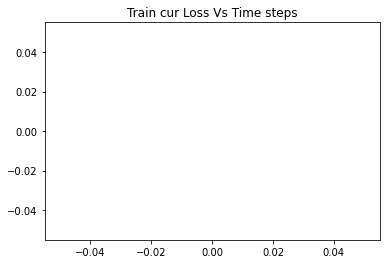

Avg loss over the epochs is  0.0


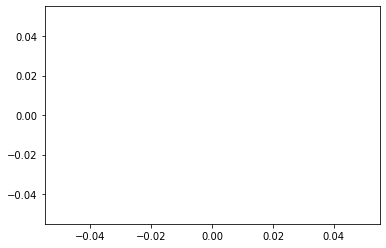

In [ ]:
neural_net = train_model()

In [ ]:
!pip install shap
!pip install seaborn
import shap
import seaborn as sns
X2 = x
explainer = shap.KernelExplainer(neural_net.getEncoded2, np.array(X2))

# Extract Shapley values from the explainer
shap_values = explainer.shap_values(np.array(X2))

Activation  tf.Tensor(
[[0.         0.         0.         ... 6.1839685  0.         6.050126  ]
 [0.         0.         0.         ... 6.4049006  0.         5.787077  ]
 [0.         0.         0.         ... 6.622809   0.         5.446129  ]
 ...
 [0.         0.         0.         ... 6.544874   0.         5.7296624 ]
 [0.         0.         0.14135781 ... 6.1425676  0.         7.695004  ]
 [0.         0.         0.         ... 7.11616    0.         6.226153  ]], shape=(97, 64), dtype=float32)


  0%|          | 0/97 [00:00<?, ?it/s]

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.537199    0.          8.573446    0.         17.44782     6.7640476
  12.156158    0.          0.          0.         10.428598   12.427021
   0.          0.          0.          3.6450105  10.585141    0.
   0.         13.006125    0.          0.          6.806268    0.
   0.          0.         11.390125    2.7807612   0.          0.29082924
  15.04054     0.          0.          0.          0.          0.
   9.089791    0.         12.21448     0.          3.1291008   6.6703563
  13.411977    0.         10.229012    0.          0.          8.951558
   0.          0.          0.          0.          0.          0.
   5.2317867   6.1839685   0.          6.050126  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.1839685 0.        6.050126 ]
 [0.        0.        0.        ... 6.363652  0.        5.7778783]
 [0.        0.        0.        ... 6.54030

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.763086    0.          8.837361    0.         18.044819    7.260886
  12.27085     0.          0.          0.         10.477997   13.587767
   0.          0.          0.          2.6874237  10.603489    0.
   0.         12.803949    0.          0.          5.762144    0.
   0.          0.         11.871977    2.5750656   0.          0.14502689
  14.92465     0.          0.          0.          0.          0.
   8.971756    0.         11.516739    0.          4.4656205   6.4817157
  13.33647     0.         10.847122    0.          0.          8.688382
   0.          0.          0.          0.          0.          0.
   5.0861006   6.4049006   0.          5.787077  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.225219  0.        6.0593247]
 [0.        0.        0.        ... 6.4049006 0.        5.787077 ]
 [0.        0.        0.        ... 6.581558

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.68089    0.         8.912491   0.        18.391926   6.8849773
  12.017379   0.         0.         0.        10.45824   12.736771
   0.         0.         0.         3.2210388 10.438543   0.
   0.        12.574848   0.         0.         6.779846   0.
   0.         0.        11.401247   2.6297357  0.         0.
  14.971268   0.         0.         0.         0.         0.
   9.103053   0.        11.558668   0.         4.0314593  6.3563986
  13.830814   0.        10.651525   0.         0.         8.632253
   0.         0.         0.         0.         0.         0.
   4.846979   6.622809   0.         5.446129 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.266468   0.         6.068523  ]
 [0.         0.         0.         ... 6.446151   0.         5.796275  ]
 [0.         0.         0.         ... 6.622809   0.         5.446129  ]
 ...
 [0.         0.

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.44823    0.         9.083368   0.        18.5186     7.1330085
  11.829123   0.         0.         0.        10.608348  12.578249
   0.         0.         0.         3.0316887 10.337694   0.
   0.        12.7605295  0.         0.         6.6991353  0.
   0.         0.        11.464214   2.5943017  0.         0.
  14.945052   0.         0.         0.         0.         0.
   9.244794   0.        11.661321   0.         3.9514384  6.324344
  13.927609   0.        10.823715   0.         0.         8.837079
   0.         0.         0.         0.         0.         0.
   4.909814   6.835514   0.         5.6023993]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3077183 0.        6.0777216]
 [0.        0.        0.        ... 6.4874    0.        5.8054733]
 [0.        0.        0.        ... 6.664058  0.        5.455327 ]
 ...
 [0.        0.        0.        ..

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  11.00112     0.          8.660789    0.         18.236423    7.5289717
  12.2542515   0.          0.          0.         11.094799   13.634624
   0.          0.          0.          3.383514   10.701504    0.
   0.         13.303605    0.          0.          7.461202    0.
   0.          0.         11.418428    3.3410172   0.          0.99204165
  14.955191    0.          0.          0.          0.          0.
   8.947693    0.         12.122731    0.          3.7690837   7.347149
  14.541975    0.         11.767185    0.          0.          9.255696
   0.          0.          0.          0.          0.          0.
   4.9195004   6.8094654   0.          6.050236  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3489676 0.        6.08692  ]
 [0.        0.        0.        ... 6.5286503 0.        5.814672 ]
 [0.        0.        0.        ... 6.705308

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.649782    0.          8.583572    0.         17.472683    6.7963386
  12.277873    0.          0.          0.         10.515359   12.522157
   0.          0.          0.          3.5532837  10.7811365   0.
   0.         13.137688    0.          0.          7.2556887   0.
   0.          0.         11.4334955   2.9051402   0.          0.52191395
  14.944312    0.          0.          0.          0.          0.
   8.99153     0.         12.428767    0.          3.1308937   6.844263
  13.603527    0.         10.716186    0.          0.          9.116388
   0.          0.          0.          0.          0.          0.
   5.3128295   6.425537    0.          6.2027283 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.746557

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.254488   0.         8.943006   0.        18.73312    8.44125
  10.898087   0.         0.         0.        12.221828  13.09365
   0.         0.         0.         3.371407   9.993088   0.
   0.        13.7993145  0.         0.         6.711513   0.
   0.         0.        11.353774   2.917874   0.         1.4859673
  14.522122   0.         0.         0.         0.         0.
   8.995325   0.        11.740026   0.         2.7851706  7.604026
  14.395688   0.        11.614702   0.         0.         9.472181
   0.         0.         0.         0.         0.         0.
   6.024006   7.373888   0.         6.9814253]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808  0.        5.4829226]
 ...
 [0.        0.        0.      

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.742167    0.          8.791582    0.         17.509132    6.753736
  12.418345    0.          0.          0.         10.497318   12.315527
   0.          0.          0.          3.7563694  10.963965    0.
   0.         13.28128     0.          0.          7.14733     0.
   0.          0.         11.443222    2.6404533   0.          0.48745048
  15.005171    0.          0.          0.          0.          0.
   9.187064    0.         12.6580925   0.          3.011786    6.6226163
  13.427662    0.         10.585281    0.          0.          9.295892
   0.          0.          0.          0.02523278  0.          0.
   5.584452    6.3871894   0.          6.4302197 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.4727173  0.         6.114515  ]
 [0.         0.         0.         ... 6.652399   0.         5.842267  ]
 [0.         0.         0.      

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.997881    0.          9.294189    0.         18.341635    6.594463
  12.666118    0.          0.          0.         10.274471   11.912889
   0.          0.          0.          3.9112084  11.043484    0.
   0.         13.315717    0.          0.          6.635477    0.
   0.          0.         11.580245    1.8836584   0.          0.09053805
  15.105506    0.          0.          0.          0.          0.
   9.769058    0.         12.586397    0.          3.270119    6.097527
  13.427502    0.         10.249232    0.          0.          9.251593
   0.          0.          0.          0.42240226  0.          0.
   5.7568173   6.255482    0.          6.4256783 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.5139666 0.        6.1237135]
 [0.        0.        0.        ... 6.6936493 0.        5.8514657]
 [0.        0.        0.        ... 6.8703074

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0591028e+01 0.0000000e+00 8.6520929e+00 0.0000000e+00
  1.7618374e+01 6.7626152e+00 1.2149787e+01 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0390721e+01 1.2396246e+01 0.0000000e+00 0.0000000e+00
  0.0000000e+00 3.6808369e+00 1.0505106e+01 0.0000000e+00 0.0000000e+00
  1.2957017e+01 0.0000000e+00 0.0000000e+00 6.6698194e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 1.1393182e+01 2.6007259e+00 0.0000000e+00
  1.7824247e-01 1.5014049e+01 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 9.2192068e+00 0.0000000e+00 1.2080578e+01
  0.0000000e+00 3.2368772e+00 6.5662665e+00 1.3469425e+01 0.0000000e+00
  1.0112096e+01 0.0000000e+00 0.0000000e+00 8.8856955e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 1.5537050e-03 0.0000000e+00 0.0000000e+00
  5.2044339e+00 6.1233225e+00 0.0000000e+00 6.0269527e+00]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.58289    0.         8.893067   0.        20.005285   5.7083697
  14.057278   0.         0.         0.        10.177621  16.452934
   0.         0.         0.         1.9601464 13.928014   0.
   0.        14.643722   0.         0.         5.923258   0.
   0.         0.        12.707739   2.6645997  0.         1.6499413
  15.9649725  0.         0.         0.         0.         0.
   9.690318   0.        14.131591   0.         5.632579   8.417236
  15.302419   0.        12.660076   0.         0.         9.504507
   0.         0.         0.         0.         0.         0.
   5.4923053  6.553517   0.         6.953787 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.555216  0.        6.1329117]
 [0.        0.        0.        ... 6.7348986 0.        5.860664 ]
 [0.        0.        0.        ... 6.9115567 0.        5.5105176]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.300398   0.         8.860421   0.        19.440924   8.173268
  12.933084   0.         0.         0.        10.250104  13.812226
   0.         0.         0.         4.0907474 12.085546   0.
   0.        13.540227   0.         0.         5.814272   0.
   0.         0.        13.167135   2.0990071  0.         0.
  14.27571    0.         0.         0.         0.         0.
   7.730099   0.        10.161367   0.         5.6586     5.7865114
  14.592489   0.        10.965393   0.         0.         8.762424
   0.         0.         0.         0.         0.         0.
   6.065671   7.8383865  0.         6.0686307]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.596466  0.        6.1421103]
 [0.        0.        0.        ... 6.776149  0.        5.8698626]
 [0.        0.        0.        ... 6.952807  0.        5.5197163]
 ...
 [0.        0.        0.        ..

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.09907568  0.          0.          0.
  12.183293    0.          7.57033     0.         18.889631    8.158748
  13.333725    0.          0.          0.          9.308303   14.498016
   0.          0.          0.          4.646911   12.191975    0.
   0.         14.705189    0.          0.          5.0166616   0.
   0.          0.         13.013528    1.9849743   0.          0.
  13.471471    0.          0.          0.          0.          0.
   6.817541    0.          8.935329    0.          6.516273    6.073241
  15.630047    0.         10.600103    0.          0.          8.314769
   0.          0.          0.          0.          0.          1.5525333
   6.7307644   8.760319    0.          5.5385585 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.6377153  0.         6.1513085 ]
 [0.         0.         0.         ... 6.817398   0.         5.8790607 ]
 [0.         0.         0.        

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.728893    0.          8.873919    0.         17.94869     6.7483406
  12.208609    0.          0.          0.          9.953339   12.257585
   0.          0.          0.          3.447022   10.7235775   0.
   0.         12.977327    0.          0.          6.871297    0.
   0.          0.         11.496684    2.2601168   0.          0.25217342
  14.678624    0.          0.          0.          0.          0.
   9.51295     0.         11.999457    0.          3.6790664   6.1514797
  13.91091     0.         10.493095    0.          0.          8.8615885
   0.          0.          0.          0.          0.          0.
   5.3805003   6.5998282   0.          6.035262  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.6789656  0.         6.160507  ]
 [0.         0.         0.         ... 6.8586483  0.         5.888259  ]
 [0.         0.         0.    

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  11.832354   0.         8.755567   0.        19.126087   8.117315
  13.342504   0.         0.         0.        11.405202  14.261887
   0.         0.         0.         3.4165392 11.036954   0.
   0.        13.772168   0.         0.         7.9350505  0.
   0.         0.        11.714793   3.7433882  0.         1.1779598
  15.652403   0.         0.         0.         0.         0.
   9.221489   0.        12.799443   0.         4.241681   7.5937185
  15.600797   0.        12.763233   0.         0.         9.399371
   0.         0.         0.         0.         0.         0.
   5.121744   7.3997912  0.         6.1341357]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3489676 0.        6.08692  ]
 [0.        0.        0.        ... 6.5286503 0.        5.814672 ]
 [0.        0.        0.        ... 6.7053084 0.        5.4645257]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.846623   0.         8.671546   0.        17.882572   6.796346
  12.447803   0.         0.         0.        10.521226  12.484812
   0.         0.         0.         3.5540242 10.722356   0.
   0.        13.091778   0.         0.         7.2096562  0.
   0.         0.        11.482524   2.7000904  0.         0.3457924
  15.030169   0.         0.         0.         0.         0.
   9.149045   0.        12.361485   0.         3.2773452  6.7966313
  13.779018   0.        10.699887   0.         0.         8.989342
   0.         0.         0.         0.         0.         0.
   5.3230853  6.3986063  0.         6.1766615]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.7465577 0.        5.4737244]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.282603   0.         8.909055   0.        19.149979   8.694495
  11.154792   0.         0.         0.        12.474862  13.089264
   0.         0.         0.         3.378375   9.953789   0.
   0.        14.004624   0.         0.         6.686776   0.
   0.         0.        11.523241   3.0704315  0.         1.8858615
  14.881926   0.         0.         0.         0.         0.
   9.183715   0.        12.060312   0.         2.4918547  7.950826
  14.802581   0.        11.857662   0.         0.         9.4543705
   0.         0.         0.         0.         0.         0.
   6.3886943  7.8950796  0.         7.1327124]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808  0.        5.4829226]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.571574    0.          8.722773    0.         17.72738     6.7444973
  12.06327     0.          0.          0.          9.820982   12.282437
   0.          0.          0.          3.3295217  10.6452055   0.
   0.         12.886108    0.          0.          7.0601964   0.
   0.          0.         11.474553    2.4331615   0.          0.40634567
  14.44894     0.          0.          0.          0.          0.
   9.32388     0.         11.8322525   0.          3.7225606   6.2605433
  14.056462    0.         10.611164    0.          0.          8.8402
   0.          0.          0.          0.          0.          0.
   5.185658    6.7822876   0.          5.9593964 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.720215  0.        6.1697054]
 [0.        0.        0.        ... 6.8998976 0.        5.8974576]
 [0.        0.        0.        ... 7.0765557

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.771685    0.          8.830095    0.         17.553871    6.752486
  12.446928    0.          0.          0.         10.526741   12.301703
   0.          0.          0.          3.794447   10.976386    0.
   0.         13.296027    0.          0.          7.1291833   0.
   0.          0.         11.445251    2.5910594   0.          0.4671191
  15.026629    0.          0.          0.          0.          0.
   9.221274    0.         12.686387    0.          2.9992394   6.6069117
  13.403458    0.         10.5692425   0.          0.          9.318803
   0.          0.          0.          0.07294618  0.          0.
   5.614704    6.3605747   0.          6.4630866 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.854263    0.          9.27865     0.         18.23513     6.5159993
  12.633707    0.          0.          0.         10.21166    11.792157
   0.          0.          0.          3.9661543  10.948483    0.
   0.         13.164777    0.          0.          6.719154    0.
   0.          0.         11.425105    1.8552386   0.          0.17276123
  14.972293    0.          0.          0.          0.          0.
   9.591833    0.         12.549911    0.          3.2602136   6.099363
  13.251579    0.         10.356713    0.          0.          9.282439
   0.          0.          0.          0.49306294  0.          0.
   5.6705756   6.302288    0.          6.529484  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.5139666 0.        6.1237135]
 [0.        0.        0.        ... 6.6936493 0.        5.8514657]
 [0.        0.        0.        ... 6.870307

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.511191    0.          8.65876     0.         17.538288    6.677376
  12.161872    0.          0.          0.         10.321741   12.344256
   0.          0.          0.          3.6962712  10.4775715   0.
   0.         12.880324    0.          0.          6.745714    0.
   0.          0.         11.325493    2.5639575   0.          0.25624865
  14.888205    0.          0.          0.          0.          0.
   9.118244    0.         12.036792    0.          3.2535746   6.5939345
  13.400697    0.         10.194346    0.          0.          8.930274
   0.          0.          0.          0.05960141  0.          0.
   5.08705     6.170889    0.          6.065113  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.1839685 0.        6.050126 ]
 [0.        0.        0.        ... 6.363652  0.        5.7778783]
 [0.        0.        0.        ... 6.540309

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  11.853758   0.         8.420009   0.        20.63497    7.3047957
  12.721874   0.         0.         0.        11.734225  16.120161
   0.         0.         0.         2.9823265 13.429062   0.
   0.        14.099737   0.         0.         6.353238   0.
   0.         0.        12.4353     3.4083734  0.         1.3170677
  17.111376   0.         0.         0.         0.         0.
   8.872571   0.        15.28787    0.         4.414531   8.258021
  13.767764   0.        13.016049   0.         0.         9.577634
   0.         0.         0.         0.         0.         0.
   6.9168434  7.169948   0.         8.406443 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.555216  0.        6.1329117]
 [0.        0.        0.        ... 6.7348986 0.        5.860664 ]
 [0.        0.        0.        ... 6.9115567 0.        5.5105176]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  12.918442    0.          8.384126    0.         20.29023     9.031344
  12.677851    0.          0.          0.         11.107771   14.810636
   0.          0.          0.          3.66173    13.533       0.
   0.         13.7029      0.          0.          5.3299365   0.
   0.          0.         14.542521    2.1689723   0.          0.
  13.702987    0.          0.          0.          0.          0.
   7.049111    0.          9.9538765   0.          5.618156    6.7377033
  15.07683     0.         11.635441    0.          0.          8.715397
   0.          0.          0.          0.37717733  0.          0.04449815
   6.8289366   8.605828    0.          6.724238  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.761465  0.        6.178904 ]
 [0.        0.        0.        ... 6.941148  0.        5.906656 ]
 [0.        0.        0.        ... 7.117806

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.19235    0.         7.8507533  0.        19.57065    8.3440485
  12.900939   0.         0.         0.        10.016714  14.462426
   0.         0.         0.         4.146132  12.635379   0.
   0.        13.738707   0.         0.         5.4343896  0.
   0.         0.        13.683862   2.1210508  0.         0.
  13.569075   0.         0.         0.         0.         0.
   7.1875963  0.         9.50088    0.         6.0783095  6.4674335
  15.489339   0.        11.334678   0.         0.         8.411649
   0.         0.         0.         0.         0.         0.7766444
   6.093624   8.385209   0.         5.7936635]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.6377153  0.         6.1513085 ]
 [0.         0.         0.         ... 6.817398   0.         5.8790607 ]
 [0.         0.         0.         ... 6.994056   0.         5.5289145 ]
 ...
 [0.    

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.66543     0.          8.881692    0.         17.939163    6.6754003
  12.221282    0.          0.          0.          9.849801   12.198652
   0.          0.          0.          3.4215899  10.7046795   0.
   0.         12.898738    0.          0.          6.87276     0.
   0.          0.         11.4554205   2.2180145   0.          0.26847976
  14.61704     0.          0.          0.          0.          0.
   9.4735985   0.         11.952659    0.          3.7361934   6.109565
  13.854002    0.         10.525259    0.          0.          8.8319235
   0.          0.          0.          0.          0.          0.
   5.322939    6.6408973   0.          6.008686  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.6789656 0.        6.160507 ]
 [0.        0.        0.        ... 6.8586483 0.        5.888259 ]
 [0.        0.        0.        ... 7.03530

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.275817   0.         8.794815   0.        19.609787   8.4287405
  13.967333   0.         0.         0.        11.574177  14.5547695
   0.         0.         0.         3.4434366 11.275526   0.
   0.        14.034004   0.         0.         8.282691   0.
   0.         0.        11.948198   3.9800713  0.         1.2708472
  16.073938   0.         0.         0.         0.         0.
   9.4319935  0.        13.278125   0.         4.4256263  7.7453985
  16.199287   0.        13.314684   0.         0.         9.4763775
   0.         0.         0.         0.         0.         0.
   5.2391925  7.7701607  0.         6.152949 ]], shape=(1, 64), dtype=float32)


The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3489676 0.        6.08692  ]
 [0.        0.        0.        ... 6.5286503 0.        5.814672 ]
 [0.        0.        0.        ... 6.7053084 0.        5.4645257]
 ...
 [0.        0.        0.        ... 7.409129  0.        5.919444 ]
 [0.        0.        0.        ... 7.3166122 0.        7.045025 ]
 [0.        0.        0.        ... 7.462858  0.        6.0317287]], shape=(210490, 64), dtype=float32)
Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.833949   0.         8.654677   0.        17.909132   6.7175136
  12.570422   0.         0.         0.        10.481289  12.419098
   0.         0.         0.         3.5329545 10.752504   0.
   0.        13.036245   0.         0.         7.357358   0.
   0.         0.        11.458174   2.720657   0.         0.3997635
  15.02226    0.         0.         0.         0.         0.
   9.037985   0.        12.430021   0.         3.2739027  6.858

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.263145   0.         8.889742   0.        19.29536    8.806614
  11.375808   0.         0.         0.        12.598478  13.060778
   0.         0.         0.         3.4534116  9.868411   0.
   0.        14.210722   0.         0.         6.6850076  0.
   0.         0.        11.600376   3.2850611  0.         2.016434
  15.093227   0.         0.         0.         0.         0.
   9.329757   0.        12.29846    0.         2.2935774  8.106231
  15.049241   0.        11.935875   0.         0.         9.448451
   0.         0.         0.         0.         0.         0.
   6.607433   8.130594   0.         7.2374916]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808  0.        5.4829226]
 ...
 [0.        0.        0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.511685    0.          8.683077    0.         17.546803    6.707248
  12.096068    0.          0.          0.          9.85952    12.287732
   0.          0.          0.          3.3491392  10.709867    0.
   0.         12.91096     0.          0.          7.2265744   0.
   0.          0.         11.440831    2.541332    0.          0.55000436
  14.4067      0.          0.          0.          0.          0.
   9.170739    0.         11.952857    0.          3.6119716   6.385295
  13.965784    0.         10.748589    0.          0.          8.961191
   0.          0.          0.          0.          0.          0.
   5.157915    6.8334446   0.          6.0439706 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.720215  0.        6.1697054]
 [0.        0.        0.        ... 6.8998976 0.        5.8974576]
 [0.        0.        0.        ... 7.0765557

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.718142    0.          8.893069    0.         17.647305    6.6439323
  12.473182    0.          0.          0.         10.3540745  12.178566
   0.          0.          0.          3.7964368  10.914752    0.
   0.         13.154109    0.          0.          7.0563073   0.
   0.          0.         11.390152    2.4168606   0.          0.4210186
  14.936981    0.          0.          0.          0.          0.
   9.239593    0.         12.5618725   0.          3.1257606   6.479921
  13.335473    0.         10.543294    0.          0.          9.24923
   0.          0.          0.          0.15422177  0.          0.
   5.528967    6.382594    0.          6.4202604 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.912344    0.          9.2422285   0.         18.18094     6.595387
  12.641312    0.          0.          0.         10.3645     11.882189
   0.          0.          0.          3.9710407  11.047561    0.
   0.         13.304954    0.          0.          6.773795    0.
   0.          0.         11.470136    2.0087926   0.          0.20577842
  15.098856    0.          0.          0.          0.          0.
   9.582346    0.         12.712355    0.          3.1333559   6.190372
  13.258606    0.         10.392575    0.          0.          9.3531065
   0.          0.          0.          0.41467822  0.          0.
   5.792785    6.27427     0.          6.5719852 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.5139666 0.        6.1237135]
 [0.        0.        0.        ... 6.6936493 0.        5.8514657]
 [0.        0.        0.        ... 6.870307

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.559571   0.         8.596025   0.        17.479214   6.776623
  12.159389   0.         0.         0.        10.466987  12.419651
   0.         0.         0.         3.680518  10.578913   0.
   0.        13.019587   0.         0.         6.7978954  0.
   0.         0.        11.38717    2.7468932  0.         0.2743942
  15.0494375  0.         0.         0.         0.         0.
   9.108165   0.        12.220311   0.         3.112236   6.6689353
  13.402202   0.        10.221756   0.         0.         8.971877
   0.         0.         0.         0.         0.         0.
   5.247256   6.165127   0.         6.087502 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.1839685 0.        6.050126 ]
 [0.        0.        0.        ... 6.363652  0.        5.7778783]
 [0.        0.        0.        ... 6.5403094 0.        5.427732 ]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  13.301718   0.         7.8117023  0.        21.547918   7.2293215
  12.543578   0.         0.         0.        12.642032  18.102985
   0.         0.         0.         3.0837421 14.236485   0.3461401
   0.        14.2225485  0.         0.         7.1309443  0.
   0.         0.        13.12441    3.1228979  0.         2.129722
  17.004717   0.         0.         0.         0.         0.
   9.449457   0.        15.611546   0.         4.124491  10.964506
  16.310873   0.        13.247848   0.         0.        10.496818
   0.         0.         0.         0.         0.         0.
   6.1244984  6.3051095  0.         9.30202  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.555216  0.        6.1329117]
 [0.        0.        0.        ... 6.7348986 0.        5.860664 ]
 [0.        0.        0.        ... 6.9115567 0.        5.5105176]
 ...
 [0.        0.       

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  11.45682    0.        11.130777   0.        21.235785   7.1971946
  12.666067   0.         0.         0.        12.567891  13.007696
   0.         0.         0.         2.406516  11.588079   0.
   0.        13.224506   0.         0.         8.206312   0.
   0.         0.        11.733219   1.739328   0.         0.
  15.992934   0.         0.         0.         0.         0.
  10.340092   0.        13.105635   0.         4.36795    6.3854036
  14.632329   0.        13.120983   0.         0.         9.994125
   0.         0.         0.         0.         0.         0.
   5.255317   8.355742   0.         5.582613 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.8027153 0.        6.1881022]
 [0.        0.        0.        ... 6.982397  0.        5.915854 ]
 [0.        0.        0.        ... 7.159055  0.        5.565708 ]
 ...
 [0.        0.        0.        .

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.924919    0.         11.889668    0.         22.154486    8.024114
  11.6906805   0.          0.          0.         12.737229   12.934232
   0.          0.          0.          2.1496148  12.25055     0.
   0.         13.263056    0.          0.          8.155401    0.
   0.          0.         12.890331    0.868502    0.          0.14171165
  15.805247    0.          0.          0.          0.          0.
  10.62538     0.         13.372581    0.          3.2884152   6.6861806
  14.606249    0.         14.017177    0.          0.         10.648845
   0.          0.          0.          0.          0.          0.
   4.614988    8.576023    0.          6.5313854 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.8439646  0.         6.197301  ]
 [0.         0.         0.         ... 7.0236473  0.         5.9250526 ]
 [0.         0.         0.      

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  12.932144    0.          8.787881    0.         20.261353    8.860519
  14.911399    0.          0.          0.         11.787134   14.919517
   0.          0.          0.          3.5231397  11.541877    0.
   0.         14.474587    0.          0.          8.783883    0.
   0.          0.         12.266322    4.412818    0.          1.400566
  16.685915    0.          0.          0.          0.          0.
   9.704155    0.         13.953895    0.          4.669394    7.975456
  17.15419     0.         14.0150585   0.          0.          9.588608
   0.          0.          0.          0.22626585  0.          0.
   5.458345    8.33394     0.          6.221283  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3489676 0.        6.08692  ]
 [0.        0.        0.        ... 6.5286503 0.        5.814672 ]
 [0.        0.        0.        ... 6.7053084 0

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  11.001088    0.          8.609594    0.         18.023756    6.819185
  12.699678    0.          0.          0.         10.677957   12.517787
   0.          0.          0.          3.5051398  10.850583    0.
   0.         13.159511    0.          0.          7.52476     0.
   0.          0.         11.549487    2.8562465   0.          0.39672273
  15.215196    0.          0.          0.          0.          0.
   9.0404625   0.         12.629468    0.          3.1677132   7.0256844
  13.868765    0.         10.976135    0.          0.          9.022528
   0.          0.          0.          0.          0.          0.
   5.408929    6.5001264   0.          6.237753  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.746557

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.239277   0.         8.795638   0.        19.466015   8.904334
  11.547479   0.         0.         0.        12.861828  13.186833
   0.         0.         0.         3.432661  10.159032   0.
   0.        14.313945   0.         0.         6.924273   0.
   0.         0.        11.725458   3.3502853  0.         2.2431026
  15.491407   0.         0.         0.         0.         0.
   9.588469   0.        12.603957   0.         2.0582683  8.436901
  15.085988   0.        12.116724   0.         0.         9.51153
   0.         0.         0.         0.         0.         0.
   6.56055    8.46484    0.         7.146855 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808  0.        5.4829226]
 ...
 [0.        0.        0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.549459    0.          8.700118    0.         17.71031     6.752203
  12.040525    0.          0.          0.          9.814339   12.285423
   0.          0.          0.          3.3066542  10.640608    0.
   0.         12.875034    0.          0.          7.071076    0.
   0.          0.         11.473221    2.4657006   0.          0.41191363
  14.450411    0.          0.          0.          0.          0.
   9.304208    0.         11.826158    0.          3.7212555   6.2632003
  14.053134    0.         10.625924    0.          0.          8.824913
   0.          0.          0.          0.          0.          0.
   5.1838007   6.8025413   0.          5.940461  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.720215  0.        6.1697054]
 [0.        0.        0.        ... 6.8998976 0.        5.8974576]
 [0.        0.        0.        ... 7.076555

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.794125    0.          8.855837    0.         17.579853    6.7558727
  12.455131    0.          0.          0.         10.554581   12.306397
   0.          0.          0.          3.8195238  10.9767      0.
   0.         13.305236    0.          0.          7.118612    0.
   0.          0.         11.442679    2.5556908   0.          0.4552946
  15.031091    0.          0.          0.          0.          0.
   9.240633    0.         12.68929     0.          2.9960027   6.6047797
  13.395198    0.         10.56849     0.          0.          9.338487
   0.          0.          0.          0.10760807  0.          0.
   5.6145716   6.338548    0.          6.4869246 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.913529    0.          9.381257    0.         18.384306    6.5218573
  12.675396    0.          0.          0.         10.271139   11.736138
   0.          0.          0.          3.9925737  11.036127    0.
   0.         13.257856    0.          0.          6.629974    0.
   0.          0.         11.473229    1.7946182   0.          0.12039554
  15.082023    0.          0.          0.          0.          0.
   9.696237    0.         12.672162    0.          3.2246444   6.0352945
  13.202203    0.         10.335478    0.          0.          9.334848
   0.          0.          0.          0.5253745   0.          0.
   5.788423    6.25317     0.          6.570293  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.5139666 0.        6.1237135]
 [0.        0.        0.        ... 6.6936493 0.        5.8514657]
 [0.        0.        0.        ... 6.87030

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0602435e+01 0.0000000e+00 8.6584997e+00 0.0000000e+00
  1.7642416e+01 6.7687502e+00 1.2153246e+01 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0403682e+01 1.2381782e+01 0.0000000e+00 0.0000000e+00
  0.0000000e+00 3.6900976e+00 1.0513078e+01 0.0000000e+00 0.0000000e+00
  1.2969237e+01 0.0000000e+00 0.0000000e+00 6.6631413e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 1.1399437e+01 2.5902574e+00 0.0000000e+00
  1.6160625e-01 1.5035488e+01 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 9.2286873e+00 0.0000000e+00 1.2091130e+01
  0.0000000e+00 3.2227640e+00 6.5572410e+00 1.3455758e+01 0.0000000e+00
  1.0112932e+01 0.0000000e+00 0.0000000e+00 8.8891249e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 1.4336041e-02 0.0000000e+00 0.0000000e+00
  5.2256742e+00 6.1273885e+00 0.0000000e+00 6.0371060e+00]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  15.9990425  0.         7.737082   0.        22.54528    5.34392
  15.077444   0.         0.         0.        12.098849  21.975948
   0.         0.         0.         4.941576  17.0855     3.7636075
   0.        15.499197   0.         0.         9.40111    0.
   0.         0.        16.627392   2.3874094  0.         5.3027954
  14.87845    0.         0.         0.         0.         0.
   9.6561365  0.        18.078562   0.         4.8413353 16.273647
  20.712759   0.        12.612424   0.5670432  0.        13.690624
   0.         0.         0.         0.         0.         0.
   4.412625   5.3273735  0.        10.641471 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[ 0.         0.         0.        ...  6.885214   0.         6.206499 ]
 [ 0.         0.         0.        ...  7.0648975  0.         5.934251 ]
 [ 0.         0.         0.        ...  7.241554   0.         5.584105 ]
 ...
 [ 0

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.133313   0.        11.613232   0.        22.702116   7.313341
  13.335334   0.         0.         0.        13.467458  13.3655405
   0.         0.         0.         2.2830064 11.7830925  0.
   0.        13.129052   0.         0.         8.969319   0.
   0.         0.        11.877101   1.4706801  0.         0.
  16.684109   0.         0.         0.         0.         0.
  10.313009   0.        13.389852   0.         4.5190926  6.782757
  15.054978   0.        14.102655   0.         0.         9.948045
   0.         0.         0.         0.         0.         0.
   5.21795    8.896056   0.         5.638223 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.8027153 0.        6.1881022]
 [0.        0.        0.        ... 6.982397  0.        5.915854 ]
 [0.        0.        0.        ... 7.159055  0.        5.565708 ]
 ...
 [0.        0.        0.        ..

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.913818   0.         7.502081   0.        20.654493   8.471444
  13.170196   0.         0.         0.        10.924365  14.8920145
   0.         0.         0.         4.4788547 13.887611   0.
   0.        12.85974    0.         0.         6.2898192  0.
   0.         0.        15.563592   1.1414938  0.         0.
  12.670523   0.         0.         0.         0.         0.
   7.9694147  0.        10.337274   0.         6.4311233  6.977499
  17.700382   0.        13.246619   0.         0.         7.839968
   0.         0.         0.         2.081146   2.1858885  1.4547997
   5.2395425  9.199661   0.         5.6702194]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.926463  0.        6.2156973]
 [0.        0.        0.        ... 7.106147  0.        5.9434495]
 [0.        0.        0.        ... 7.282804  0.        5.593303 ]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.685184    0.          8.833045    0.         17.901789    6.770028
  12.144997    0.          0.          0.          9.970098   12.30922
   0.          0.          0.          3.4015198  10.701233    0.
   0.         12.956249    0.          0.          6.9091024   0.
   0.          0.         11.495755    2.3232625   0.          0.28588253
  14.639092    0.          0.          0.          0.          0.
   9.468949    0.         11.955788    0.          3.6860006   6.197031
  13.935823    0.         10.531746    0.          0.          8.853828
   0.          0.          0.          0.          0.          0.
   5.332393    6.6324997   0.          6.002365  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.6789656 0.        6.160507 ]
 [0.        0.        0.        ... 6.8586483 0.        5.888259 ]
 [0.        0.        0.        ... 7.0353065 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  14.374737    0.          8.774515    0.         21.67263     9.805297
  16.96815     0.          0.          0.         12.190614   15.689458
   0.          0.          0.          3.6573546  12.128752    0.
   0.         15.412418    0.          0.          9.842093    0.
   0.          0.         12.939872    5.2869678   0.          1.6943918
  17.991806    0.          0.          0.          0.          0.
  10.316131    0.         15.415335    0.          5.2165184   8.476421
  19.259275    0.         15.567986    0.          0.          9.742409
   0.          0.          0.          0.83442914  0.16937874  0.
   5.9482155   9.502485    0.          6.4221845 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.3489676  0.         6.08692   ]
 [0.         0.         0.         ... 6.5286503  0.         5.814672  ]
 [0.         0.         0.        

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  11.271625    0.          8.643256    0.         18.505291    6.8520145
  12.945181    0.          0.          0.         10.756653   12.540406
   0.          0.          0.          3.4574547  10.779076    0.
   0.         13.108752    0.          0.          7.644084    0.
   0.          0.         11.631108    2.7209342   0.          0.24369916
  15.319671    0.          0.          0.          0.          0.
   9.1396      0.         12.582265    0.          3.3156972   7.1252227
  14.19241     0.         11.092488    0.          0.          8.881839
   0.          0.          0.          0.          0.          0.
   5.367752    6.5297413   0.          6.2151084 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.390218   0.         6.0961185 ]
 [0.         0.         0.         ... 6.5698996  0.         5.8238707 ]
 [0.         0.         0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.87461    0.         8.270906   0.        19.88693    8.6916065
  12.095      0.         0.         0.        12.870806  14.004828
   0.         0.         0.         2.583557  10.409595   0.
   0.        13.943025   0.         0.         6.7148724  0.
   0.         0.        11.700135   3.2023954  0.         3.0687926
  16.538157   0.         0.         0.         0.         0.
  10.08329    0.        13.223919   0.         2.0051143  9.375707
  15.874597   0.        12.837228   0.         0.         9.0956545
   0.         0.         0.         0.         0.         0.
   6.738835   8.465033   0.         6.836735 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808  0.        5.4829226]
 ...
 [0.        0.        0.  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.553639   0.         8.706972   0.        17.711082   6.753668
  12.039472   0.         0.         0.         9.8284    12.2984085
   0.         0.         0.         3.3136697 10.6380205  0.
   0.        12.877467   0.         0.         7.076298   0.
   0.         0.        11.476116   2.457962   0.         0.4176212
  14.436733   0.         0.         0.         0.         0.
   9.308009   0.        11.819885   0.         3.722071   6.275868
  14.0628395  0.        10.624421   0.         0.         8.837757
   0.         0.         0.         0.         0.         0.
   5.171794   6.7971287  0.         5.945983 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.720215  0.        6.1697054]
 [0.        0.        0.        ... 6.8998976 0.        5.8974576]
 [0.        0.        0.        ... 7.0765557 0.        5.5473113]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.784001    0.          8.851587    0.         17.587698    6.74105
  12.473459    0.          0.          0.         10.53074    12.290254
   0.          0.          0.          3.7970533  11.001083    0.
   0.         13.308086    0.          0.          7.109673    0.
   0.          0.         11.448148    2.5729043   0.          0.4515503
  15.058179    0.          0.          0.          0.          0.
   9.244212    0.         12.717462    0.          2.9993858   6.5837393
  13.3732      0.         10.568735    0.          0.          9.31903
   0.          0.          0.          0.08266997  0.          0.
   5.651056    6.35298     0.          6.465933  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057  0

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.394275   0.         9.416058   0.        18.167397   6.8312817
  11.500247   0.         0.         0.         9.706062  11.842201
   0.         0.         0.         2.7342987 10.910974   0.
   0.        13.09321    0.         0.         6.8383207  0.
   0.         0.        11.937309   2.049765   0.         0.6432516
  14.07721    0.         0.         0.         0.         0.
   9.65899    0.        12.005491   0.         3.9981067  5.902661
  14.242148   0.        11.221835   0.         0.         9.272596
   0.         0.         0.         0.         0.         0.
   4.833124   7.1223154  0.         6.014332 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.9677134 0.        6.224896 ]
 [0.        0.        0.        ... 7.147397  0.        5.9526477]
 [0.        0.        0.        ... 7.3240533 0.        5.602502 ]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.497795    0.          9.047056    0.         18.103668    6.800389
  11.721326    0.          0.          0.          9.570053   12.241808
   0.          0.          0.          2.9123197  10.728235    0.
   0.         12.834713    0.          0.          7.036771    0.
   0.          0.         11.487554    2.2591655   0.          0.47391182
  14.155264    0.          0.          0.          0.          0.
   9.576963    0.         11.606048    0.          4.211197    5.911352
  14.452007    0.         11.037708    0.          0.          8.843646
   0.          0.          0.          0.          0.          0.
   5.0327187   7.148047    0.          5.720934  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.0089626 0.        6.234094 ]
 [0.        0.        0.        ... 7.1886463 0.        5.9618464]
 [0.        0.        0.        ... 7.3653035

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.842448    0.          9.52154     0.         18.615892    6.63055
  12.495216    0.          0.          0.          9.467798   11.795119
   0.          0.          0.          3.5398674  11.090939    0.
   0.         12.893799    0.          0.          6.9434056   0.
   0.          0.         11.662767    1.5197426   0.          0.14478353
  14.265532    0.          0.          0.          0.          0.
   9.554374    0.         11.812914    0.          4.188656    5.587019
  13.724757    0.         10.826707    0.          0.          9.289893
   0.          0.          0.          0.29140288  0.          0.
   5.422246    7.0861344   0.          6.3321266 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.050213  0.        6.243293 ]
 [0.        0.        0.        ... 7.2298965 0.        5.9710445]
 [0.        0.        0.        ... 7.406553  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.632696    0.          8.751818    0.         17.773516    6.787501
  12.065918    0.          0.          0.          9.925415   12.349423
   0.          0.          0.          3.3585324  10.616456    0.
   0.         12.922338    0.          0.          6.9559135   0.
   0.          0.         11.468477    2.4039085   0.          0.33572894
  14.540748    0.          0.          0.          0.          0.
   9.392902    0.         11.848148    0.          3.7189147   6.252325
  14.039319    0.         10.550856    0.          0.          8.822868
   0.          0.          0.          0.          0.          0.
   5.21331     6.6601515   0.          5.9747596 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.6789656 0.        6.160507 ]
 [0.        0.        0.        ... 6.8586483 0.        5.888259 ]
 [0.        0.        0.        ... 7.0353065

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.40165     0.          8.395756    0.         17.346636    7.0148215
  11.650806    0.          0.          0.         10.7274475  12.878147
   0.          0.          0.          3.4825716  10.420895    0.
   0.         13.08691     0.          0.          7.2766156   0.
   0.          0.         11.439128    3.157652    0.          0.68979394
  14.485675    0.          0.          0.          0.          0.
   8.811901    0.         11.808662    0.          3.1956887   7.201225
  13.911639    0.         10.682527    0.          0.          9.119795
   0.          0.          0.          0.          0.          0.
   4.946891    6.488616    0.          6.0838747 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3489676 0.        6.08692  ]
 [0.        0.        0.        ... 6.5286503 0.        5.814672 ]
 [0.        0.        0.        ... 6.705308

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.494403   0.         8.584002   0.        17.63323    6.79186
  11.98709    0.         0.         0.        10.109381  12.4051895
   0.         0.         0.         3.4138527 10.472909   0.
   0.        12.8865795  0.         0.         6.8193126  0.
   0.         0.        11.431852   2.6754029  0.         0.2643301
  14.757597   0.         0.         0.         0.         0.
   9.221489   0.        11.855681   0.         3.5075104  6.45467
  13.786584   0.        10.326264   0.         0.         8.746779
   0.         0.         0.         0.         0.         0.
   5.1428256  6.4383216  0.         5.86488  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.390218   0.         6.0961185 ]
 [0.         0.         0.         ... 6.5698996  0.         5.8238707 ]
 [0.         0.         0.         ... 6.7465577  0.         5.4737244 ]
 ...
 [0.       

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.065999    0.          9.235624    0.         18.493631    8.075183
  11.071123    0.          0.          0.         11.598881   12.632809
   0.          0.          0.          3.6272168   9.987515    0.
   0.         14.047767    0.          0.          6.813896    0.
   0.          0.         11.17019     3.3239481   0.          0.73495656
  14.66896     0.          0.          0.          0.          0.
   9.221048    0.         11.715999    0.          2.9317083   7.013949
  14.023199    0.         11.04753     0.          0.          9.522661
   0.          0.          0.          0.          0.          0.
   5.860746    6.688702    0.          6.960769  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.604577    0.          8.693743    0.         17.646395    6.7633758
  12.148274    0.          0.          0.         10.138311   12.353662
   0.          0.          0.          3.4848962  10.643438    0.
   0.         12.977866    0.          0.          6.8883877   0.
   0.          0.         11.438683    2.554763    0.          0.31202608
  14.795899    0.          0.          0.          0.          0.
   9.281416    0.         12.072367    0.          3.4503386   6.4040303
  13.728852    0.         10.418183    0.          0.          8.881417
   0.          0.          0.          0.          0.          0.
   5.2831907   6.4590335   0.          6.0255246 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.82905

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.418868   0.         9.011497   0.        17.940239   6.7857
  11.605112   0.         0.         0.         9.413137  12.036245
   0.         0.         0.         2.7566512 10.741488   0.
   0.        12.926268   0.         0.         7.0662885  0.
   0.         0.        11.668513   2.2570229  0.         0.6215386
  13.955155   0.         0.         0.         0.         0.
   9.566504   0.        11.679802   0.         4.1709294  5.9098296
  14.594924   0.        11.097146   0.         0.         8.883623
   0.         0.         0.         0.         0.         0.
   4.9343433  7.2624907  0.         5.8271637]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.091462  0.        6.252491 ]
 [0.        0.        0.        ... 7.2711463 0.        5.980243 ]
 [0.        0.        0.        ... 7.447802  0.        5.630097 ]
 ...
 [0.        0.        0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.678873   0.         9.30423    0.        18.327301   6.7514706
  11.899342   0.         0.         0.         9.525244  11.8165
   0.         0.         0.         3.0388095 10.88837    0.
   0.        13.086302   0.         0.         6.924379   0.
   0.         0.        11.72216    1.8604519  0.         0.4481907
  14.14134    0.         0.         0.         0.         0.
   9.855571   0.        11.924949   0.         4.077264   5.7201195
  14.453708   0.        10.951685   0.         0.         9.021773
   0.         0.         0.         0.         0.         0.
   5.276552   7.1310835  0.         6.099304 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.1327124 0.        6.2616897]
 [0.        0.        0.        ... 7.3123956 0.        5.9894414]
 [0.        0.        0.        ... 7.4890513 0.        5.6392956]
 ...
 [0.        0.        0.    

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
   9.197533    0.          8.60173     0.         16.400862    5.5146875
  12.226039    0.          0.          0.          8.805563   11.444014
   0.          0.          0.          3.5586023  10.141591    0.
   0.         11.519534    0.          0.          7.90048     0.
   0.          0.         10.490961    2.1557558   0.          1.3810952
  13.055396    0.          0.          0.          0.          0.
   7.705437    0.         11.420682    0.          3.7451813   6.6454015
  12.574776    0.         11.396659    0.          0.          9.198306
   0.          0.          0.          0.43508005  0.          0.
   3.6069045   7.2138906   0.          6.2340097 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.746557

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
   8.994913    0.          8.667454    0.         16.196983    5.258795
  12.339083    0.          0.          0.          8.545666   11.246091
   0.          0.          0.          3.5781546  10.183574    0.
   0.         11.315958    0.          0.          8.177156    0.
   0.          0.         10.321224    2.0213017   0.          1.6380152
  12.731674    0.          0.          0.          0.          0.
   7.450072    0.         11.451869    0.          3.8028839   6.638673
  12.335095    0.         11.720889    0.          0.          9.345734
   0.16354705  0.          0.          0.56017846  0.          0.
   3.4058678   7.4164553   0.          6.3677955 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  11.0123625   0.          9.480848    0.         18.41728     6.6533575
  12.680793    0.          0.          0.         10.477109   11.784332
   0.          0.          0.          3.9979856  11.212761    0.
   0.         13.510378    0.          0.          6.645634    0.
   0.          0.         11.605075    1.8665267   0.          0.15681598
  15.260904    0.          0.          0.          0.          0.
   9.793577    0.         12.964436    0.          3.0499492   6.089277
  13.240848    0.         10.415634    0.          0.          9.493694
   0.          0.          0.          0.4668945   0.          0.
   5.924335    6.1767755   0.          6.666009  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.5139666  0.         6.1237135 ]
 [0.         0.         0.         ... 6.6936493  0.         5.8514657 ]
 [0.         0.         0.      

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.568184    0.          8.612992    0.         17.5159      6.7718534
  12.182833    0.          0.          0.         10.482338   12.401816
   0.          0.          0.          3.6924934  10.603552    0.
   0.         13.036105    0.          0.          6.79192     0.
   0.          0.         11.400792    2.736386    0.          0.26376408
  15.075605    0.          0.          0.          0.          0.
   9.128672    0.         12.255681    0.          3.0959518   6.6587152
  13.378241    0.         10.209229    0.          0.          8.980166
   0.          0.          0.          0.          0.          0.
   5.2952595   6.1672735   0.          6.0960693 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.1839685 0.        6.050126 ]
 [0.        0.        0.        ... 6.363652  0.        5.7778783]
 [0.        0.        0.        ... 6.54030

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  12.992716    0.          6.085485    0.         21.700665    8.956552
  14.895996    0.          0.          0.         13.895613   14.058667
   0.          0.          0.          1.0961598  14.62568     0.
   0.         16.34764     0.          0.          7.1591988   0.
   0.          0.         15.640313    6.3980875   0.          4.742907
  15.735399    0.          1.2421278   0.          0.          0.
  12.266214    0.         15.58264     0.          0.44980785 12.273332
  19.569712    0.         13.022682    0.          0.          8.825832
   0.          0.          0.          0.          0.          0.
   9.56525    11.807481    0.          7.691515  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[ 0.         0.         0.        ...  7.173962   0.         6.270888 ]
 [ 0.         0.         0.        ...  7.353646   0.         5.99864  ]
 [ 0.         0.         0.        

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         2.5794342
  11.12786    0.        21.597834   0.        34.434994   9.153741
  16.191858   0.         0.         8.296803  22.027538  18.134989
   0.         0.         0.         3.6205451 19.101791   0.
   0.        14.985122   0.         0.        17.855827   0.
   0.         0.        20.625204   0.         0.         0.
  24.723398   0.         0.         0.         0.         0.
  19.124691   0.        15.403126   0.         6.0790176 10.744442
  17.440836   0.        19.530384   0.         0.        17.019167
   0.         0.         0.         3.0320613  4.239898   0.
   5.890374  10.89631    0.         7.000905 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.2152123 0.        6.2800865]
 [0.        0.        0.        ... 7.394896  0.        6.0078382]
 [0.        0.        0.        ... 7.571551  0.        5.6576924]
 ...
 [0.        0.        0.    

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  11.833708    0.         14.776912    0.         30.58855     9.808007
  16.297743    0.          0.          2.6813257  15.674793   15.984893
   0.          0.          0.          1.2715154  13.876305    0.
   0.         12.680431    0.          0.         13.528223    0.
   0.          0.         16.490536    0.          0.1494018   0.
  19.423727    0.          0.77453333  0.          0.          0.
  10.801015    0.         14.565744    0.          2.9450936   9.544066
  17.32929     0.         19.058739    0.          0.         10.792918
   0.          0.          0.          1.008116    2.5037882   0.
   4.040998   11.8962965   0.          8.22922   ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[ 0.         0.         0.        ...  7.2564616  0.         6.2892847]
 [ 0.         0.         0.        ...  7.4361463  0.         6.017037 ]
 [ 0.         0.         0.        ...  7

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  20.50033    0.         8.732427   0.        27.644455  13.953439
  25.876488   0.         0.         0.        14.242908  18.940027
   0.         0.         0.         4.5634184 14.549191   0.
   0.        19.670103   0.         0.        14.65401    0.
   0.         0.        16.025206   9.186446   0.         2.8865504
  23.501062   0.         0.         0.         0.         0.
  12.991382   0.        21.757132   0.         7.382375  10.726469
  28.413795   0.        21.986982   0.         0.        10.734693
   0.         0.         0.         3.9903736  2.154386   0.
   8.033082  14.784005   0.         7.3844156]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.34896755e+00
  0.00000000e+00 6.08691978e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.52865028e+00
  0.00000000e+00 5.81467199e+00]
 [0.00000000e+00 0.00000000e+00 0.00

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  12.3324995   0.          8.50337     0.         19.920658    6.982573
  14.172441    0.          0.          0.         11.2861595  12.68539
   0.          0.          0.          3.206256   10.908833    0.
   0.         13.175245    0.          0.          8.752435    0.
   0.          0.         11.969325    2.821002    0.          0.06417299
  15.986143    0.          0.          0.          0.          0.
   9.066459    0.         13.123211    0.          3.3851316   8.026238
  15.317137    0.         12.068103    0.          0.          8.608815
   0.          0.          0.          0.          0.14788854  0.
   5.474407    6.816138    0.          6.370478  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.7465577 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  12.843115   0.         6.864642   1.038031  22.029081   8.959894
  15.436704   0.         0.         0.        13.851497  15.673493
   0.         0.         0.         1.923527  12.193809   0.
   0.        14.584985   0.         0.         8.425333   0.
   0.         0.        14.0238085  4.243858   0.         4.732339
  20.895178   0.         0.         0.         0.         0.
  12.860049   0.        16.778614   0.         0.        13.954136
  19.520468   0.        14.513264   0.         0.         9.438112
   0.         0.         0.         0.         1.2179911  0.
   7.7316217  9.593634   0.         6.5179944]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.431467  0.        6.1053166]
 [0.        0.        0.        ... 6.61115   0.        5.833069 ]
 [0.        0.        0.        ... 6.787808  0.        5.4829226]
 ...
 [0.        0.        0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.484771   0.         8.6270075  0.        17.623325   6.7688284
  11.963192   0.         0.         0.         9.7924385 12.342226
   0.         0.         0.         3.2315018 10.613667   0.
   0.        12.837959   0.         0.         7.123922   0.
   0.         0.        11.477072   2.5648925  0.         0.4615363
  14.395606   0.         0.         0.         0.         0.
   9.23273    0.        11.768046   0.         3.7407877  6.3164024
  14.095653   0.        10.673107   0.         0.         8.796711
   0.         0.         0.         0.         0.         0.
   5.1100597  6.8565483  0.         5.8731914]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.720215  0.        6.1697054]
 [0.        0.        0.        ... 6.8998976 0.        5.8974576]
 [0.        0.        0.        ... 7.0765557 0.        5.5473113]
 ...
 [0.        0.        0.  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.776654    0.          8.849877    0.         17.578281    6.744292
  12.458895    0.          0.          0.         10.540229   12.31664
   0.          0.          0.          3.784869   10.995749    0.
   0.         13.296629    0.          0.          7.1137996   0.
   0.          0.         11.443091    2.5781689   0.          0.4600339
  15.049417    0.          0.          0.          0.          0.
   9.236557    0.         12.710774    0.          3.01131     6.592429
  13.368755    0.         10.588742    0.          0.          9.318635
   0.          0.          0.          0.07267158  0.          0.
   5.6327      6.3477826   0.          6.456797  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057  0

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  11.635311   0.         9.583337   0.        18.297102   5.6283607
  13.659899   0.         0.         0.         9.777694  13.805219
   0.         0.         0.         2.324905  12.495248   0.
   0.        14.484796   0.         0.         6.5713015  0.
   0.         0.        11.763133   2.0800555  0.         1.0693525
  14.666323   0.         0.         0.         0.         0.
   9.926805   0.        12.555272   0.         4.8606696  6.679752
  14.476249   0.        12.114039   0.         0.         9.542029
   0.         0.         0.         0.         0.         0.
   5.0387774  6.7161794  0.         6.0020165]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.885214  0.        6.206499 ]
 [0.        0.        0.        ... 7.0648975 0.        5.934251 ]
 [0.        0.        0.        ... 7.241554  0.        5.584105 ]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.551794   0.         9.204491   0.        18.345673   6.96856
  11.690493   0.         0.         0.         9.797408  12.37578
   0.         0.         0.         2.8932517 10.761132   0.
   0.        12.861387   0.         0.         7.0501714  0.
   0.         0.        11.48337    2.2153754  0.         0.4222887
  14.221448   0.         0.         0.         0.         0.
   9.571649   0.        11.566323   0.         4.2684255  5.917263
  14.463165   0.        11.212819   0.         0.         8.966574
   0.         0.         0.         0.         0.         0.
   5.0451097  7.256264   0.         5.7428517]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.0089626 0.        6.234094 ]
 [0.        0.        0.        ... 7.1886463 0.        5.9618464]
 [0.        0.        0.        ... 7.3653035 0.        5.6117   ]
 ...
 [0.        0.        0.      

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.433215   0.         9.881868   0.        18.71429    7.1786427
  11.304138   0.         0.         0.         9.908283  11.881617
   0.         0.         0.         2.5773466 11.03191    0.
   0.        13.356912   0.         0.         7.0201244  0.
   0.         0.        11.726736   1.954643   0.         0.7816367
  13.996286   0.         0.         0.         0.         0.
   9.967008   0.        12.034779   0.         4.163323   5.661005
  14.7227125  0.        11.831199   0.         0.         9.49656
   0.         0.         0.         0.         0.         0.
   5.1069665  7.6066504  0.         6.203792 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.2977104 0.        6.2984834]
 [0.        0.        0.        ... 7.4773955 0.        6.026235 ]
 [0.        0.        0.        ... 7.6540504 0.        5.676089 ]
 ...
 [0.        0.        0.    

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.524285   0.         8.505245   0.        17.579353   7.175758
  11.754598   0.         0.         0.        10.812955  13.12107
   0.         0.         0.         3.4075134 10.485597   0.
   0.        13.119837   0.         0.         7.2416277  0.
   0.         0.        11.392433   3.1697567  0.         0.7548181
  14.595218   0.         0.         0.         0.         0.
   8.800543   0.        11.804102   0.         3.4180276  7.184893
  13.964029   0.        10.978094   0.         0.         9.155729
   0.         0.         0.         0.         0.         0.
   4.928691   6.5307875  0.         6.06992  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.3489676  0.         6.08692   ]
 [0.         0.         0.         ... 6.5286503  0.         5.814672  ]
 [0.         0.         0.         ... 6.7053084  0.         5.4645257 ]
 ...
 [0.       

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.545568   0.         8.600418   0.        17.596848   6.7805724
  12.096037   0.         0.         0.        10.23363   12.421879
   0.         0.         0.         3.4690573 10.602698   0.
   0.        12.981322   0.         0.         6.93125    0.
   0.         0.        11.433421   2.7382083  0.         0.3357247
  14.846945   0.         0.         0.         0.         0.
   9.158829   0.        12.071459   0.         3.376195   6.548858
  13.676626   0.        10.439963   0.         0.         8.871522
   0.         0.         0.         0.         0.         0.
   5.2423005  6.4265165  0.         5.9773536]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.7465577 0.        5.4737244]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.131003   0.         9.0804405  0.        18.519575   8.185949
  11.007506   0.         0.         0.        11.687186  12.786295
   0.         0.         0.         3.5168858  9.988798   0.
   0.        13.952659   0.         0.         6.778805   0.
   0.         0.        11.290441   3.2116973  0.         0.8670614
  14.582527   0.         0.         0.         0.         0.
   9.070937   0.        11.591692   0.         3.0109577  7.1466074
  14.101658   0.        11.135929   0.         0.         9.474683
   0.         0.         0.         0.         0.         0.
   5.8854976  6.898906   0.         6.9090533]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.431467   0.         6.1053166 ]
 [0.         0.         0.         ... 6.61115    0.         5.833069  ]
 [0.         0.         0.         ... 6.787808   0.         5.4829226 ]
 ...
 [0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.654999    0.          8.687942    0.         17.359156    6.782406
  12.300039    0.          0.          0.         10.46647    12.405424
   0.          0.          0.          3.662461   10.8884535   0.
   0.         13.225072    0.          0.          7.218922    0.
   0.          0.         11.426665    2.7667766   0.          0.56235576
  14.896285    0.          0.          0.          0.          0.
   9.083247    0.         12.542276    0.          3.0535674   6.7046576
  13.52077     0.         10.646906    0.          0.          9.257345
   0.          0.          0.          0.          0.          0.
   5.442361    6.4433975   0.          6.358006  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.557161   0.         9.170908   0.        18.112583   6.8058105
  11.670645   0.         0.         0.         9.324562  11.978309
   0.         0.         0.         2.7789714 10.841171   0.
   0.        13.001797   0.         0.         7.2311606  0.
   0.         0.        11.734739   2.0327275  0.         0.6868255
  13.764652   0.         0.         0.         0.         0.
   9.703004   0.        11.660313   0.         4.306168   5.7992396
  14.826857   0.        11.282551   0.         0.         8.995564
   0.         0.         0.         0.         0.         0.
   5.0284414  7.435688   0.         5.9770446]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.3389606 0.        6.3076816]
 [0.        0.        0.        ... 7.518645  0.        6.0354333]
 [0.        0.        0.        ... 7.6953006 0.        5.6852875]
 ...
 [0.        0.        0.  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.399902   0.         8.746769   0.        17.609446   6.799653
  12.435963   0.         0.         0.         9.618942  12.595067
   0.         0.         0.         2.9506445 11.230766   0.
   0.        13.505187   0.         0.         7.729897   0.
   0.         0.        11.633346   2.8102965  0.         1.0058472
  13.974825   0.         0.         0.         0.         0.
   8.974311   0.        12.36496    0.         3.9216373  6.3640094
  14.684145   0.        11.880179   0.         0.         9.621157
   0.         0.         0.         0.         0.         0.
   5.4085503  7.7165794  0.         6.147583 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.38021   0.        6.31688  ]
 [0.        0.        0.        ... 7.559894  0.        6.044632 ]
 [0.        0.        0.        ... 7.73655   0.        5.6944857]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.579694   0.         8.957667   0.        17.589104   6.606425
  12.393184   0.         0.         0.         9.504345  12.1353855
   0.         0.         0.         3.252698  11.25302    0.
   0.        13.179484   0.         0.         7.9879155  0.
   0.         0.        11.487092   2.3524563  0.         1.0707831
  13.830072   0.         0.         0.         0.         0.
   9.113736   0.        12.30092    0.         3.806226   6.242279
  14.345371   0.        11.715932   0.         0.         9.527044
   0.         0.         0.         0.         0.         0.
   5.37789    7.6007996  0.         6.453611 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.42146   0.        6.3260784]
 [0.        0.        0.        ... 7.6011443 0.        6.05383  ]
 [0.        0.        0.        ... 7.7778    0.        5.7036843]
 ...
 [0.        0.        0.   

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.380291   0.         8.390127   0.        17.189283   6.8464713
  11.883093   0.         0.         0.        10.286636  12.6080475
   0.         0.         0.         3.3794322 10.517079   0.
   0.        12.926901   0.         0.         7.1182218  0.
   0.         0.        11.4100485  3.0179021  0.         0.5340424
  14.679964   0.         0.         0.         0.         0.
   8.902506   0.        11.963467   0.         3.2956908  6.8084908
  13.75959    0.        10.538974   0.         0.         8.914523
   0.         0.         0.         0.         0.         0.
   4.9826303  6.4916396  0.         5.924575 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.3489676 0.        6.08692  ]
 [0.        0.        0.        ... 6.5286503 0.        5.814672 ]
 [0.        0.        0.        ... 6.7053084 0.        5.4645257]
 ...
 [0.        0.        0. 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.249349    0.          8.497032    0.         17.37355     6.6249766
  11.933985    0.          0.          0.          9.819929   12.31534
   0.          0.          0.          3.3151565  10.37007     0.
   0.         12.604259    0.          0.          6.954201    0.
   0.          0.         11.303272    2.6606836   0.          0.42931008
  14.45825     0.          0.          0.          0.          0.
   8.973881    0.         11.669563    0.          3.6277716   6.464698
  13.708695    0.         10.460118    0.          0.          8.69898
   0.          0.          0.          0.          0.          0.
   4.8260036   6.6029034   0.          5.7864914 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.7465577 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[0.00000000e+00 0.00000000e+00 9.66925800e-01 0.00000000e+00
  0.00000000e+00 0.00000000e+00 9.17294025e+00 0.00000000e+00
  1.15966578e+01 0.00000000e+00 1.99672050e+01 9.13583469e+00
  1.09852190e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00
  1.25646925e+01 1.15699224e+01 0.00000000e+00 0.00000000e+00
  0.00000000e+00 4.86938477e+00 9.18384361e+00 0.00000000e+00
  0.00000000e+00 1.63124962e+01 0.00000000e+00 0.00000000e+00
  6.68322754e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  9.98068047e+00 4.69325066e+00 0.00000000e+00 1.35625098e-02
  1.60545597e+01 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 1.09300470e+01 0.00000000e+00
  1.27150021e+01 0.00000000e+00 2.04020190e+00 6.05383587e+00
  1.36251202e+01 0.00000000e+00 1.15286760e+01 0.00000000e+00
  0.00000000e+00 1.09225960e+01 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  6.50752735e+00 5.50010920e+00 0.00000000e+00 

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
   9.498798    0.          8.679131    0.         16.673752    5.737346
  12.251545    0.          0.          0.          9.028352   11.604491
   0.          0.          0.          3.540411   10.285836    0.
   0.         11.809424    0.          0.          7.7442765   0.
   0.          0.         10.668791    2.158283    0.          1.2018183
  13.348438    0.          0.          0.          0.          0.
   8.044611    0.         11.579954    0.          3.7355683   6.549083
  12.810335    0.         11.288261    0.          0.          9.171336
   0.          0.          0.          0.34862506  0.          0.
   3.9555871   7.1071396   0.          6.237554  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.427391   0.         9.019056   0.        17.936092   6.789689
  11.601772   0.         0.         0.         9.427403  12.05065
   0.         0.         0.         2.77053   10.729609   0.
   0.        12.926367   0.         0.         7.070087   0.
   0.         0.        11.666675   2.2418149  0.         0.6271668
  13.935027   0.         0.         0.         0.         0.
   9.568849   0.        11.66638    0.         4.1735563  5.924351
  14.610321   0.        11.09432    0.         0.         8.897754
   0.         0.         0.         0.         0.         0.
   4.912541   7.2491884  0.         5.840512 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.091462  0.        6.252491 ]
 [0.        0.        0.        ... 7.2711463 0.        5.980243 ]
 [0.        0.        0.        ... 7.447802  0.        5.630097 ]
 ...
 [0.        0.        0.     

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.679437    0.          9.30502     0.         18.329046    6.748
  11.899726    0.          0.          0.          9.522735   11.819404
   0.          0.          0.          3.0362759  10.891159    0.
   0.         13.087532    0.          0.          6.9230046   0.
   0.          0.         11.720386    1.8624963   0.          0.44907302
  14.141038    0.          0.          0.          0.          0.
   9.85518     0.         11.921748    0.          4.080964    5.720593
  14.454364    0.         10.954312    0.          0.          9.021582
   0.          0.          0.          0.          0.          0.
   5.273705    7.1297255   0.          6.09613   ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.1327124 0.        6.2616897]
 [0.        0.        0.        ... 7.3123956 0.        5.9894414]
 [0.        0.        0.        ... 7.4890513 0.

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.303318    0.          8.47955     0.         17.480434    6.715025
  11.838422    0.          0.          0.          9.822981   12.398848
   0.          0.          0.          3.2531006  10.281775    0.
   0.         12.604191    0.          0.          6.8185005   0.
   0.          0.         11.353154    2.6418717   0.          0.31529093
  14.479622    0.          0.          0.          0.          0.
   9.0957775   0.         11.5139885   0.          3.7344267   6.407568
  13.884115    0.         10.34636     0.          0.          8.576612
   0.          0.          0.          0.          0.          0.
   4.8066998   6.559322    0.          5.677789  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.7465577

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
   9.005558    0.          8.679156    0.         16.209385    5.258857
  12.346979    0.          0.          0.          8.555286   11.242653
   0.          0.          0.          3.5918481  10.184608    0.
   0.         11.3217535   0.          0.          8.171756    0.
   0.          0.         10.3208475   2.0049353   0.          1.6323482
  12.734698    0.          0.          0.          0.          0.
   7.4602075   0.         11.456272    0.          3.7994354   6.6361885
  12.33235     0.         11.714945    0.          0.          9.35401
   0.16940846  0.          0.          0.5768879   0.          0.
   3.411411    7.406946    0.          6.3805556 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.574891   0.         9.188284   0.        18.123125   6.812081
  11.67151    0.         0.         0.         9.349384  11.986774
   0.         0.         0.         2.8032813 10.8319025  0.
   0.        13.007925   0.         0.         7.228584   0.
   0.         0.        11.731081   2.00493    0.         0.6826882
  13.75427    0.         0.         0.         0.         0.
   9.714508   0.        11.652143   0.         4.303607   5.8070784
  14.8347     0.        11.278164   0.         0.         9.01538
   0.         0.         0.         0.         0.         0.
   5.016221   7.4174404  0.         6.000596 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.3389606 0.        6.3076816]
 [0.        0.        0.        ... 7.518645  0.        6.0354333]
 [0.        0.        0.        ... 7.6953006 0.        5.6852875]
 ...
 [0.        0.        0.    

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.         0.         0.         0.         0.         0.
  10.326933   0.         8.776323   0.        17.58736    6.6946287
  12.5150385  0.         0.         0.         9.526343  12.493069
   0.         0.         0.         2.9736009 11.255943   0.
   0.        13.450433   0.         0.         7.770468   0.
   0.         0.        11.584271   2.7594101  0.         1.0531415
  13.922071   0.         0.         0.         0.         0.
   8.899652   0.        12.404582   0.         3.9233005  6.3395076
  14.559448   0.        11.943319   0.         0.         9.663762
   0.         0.         0.         0.         0.         0.
   5.3852787  7.768715   0.         6.17972  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.38021   0.        6.31688  ]
 [0.        0.        0.        ... 7.559894  0.        6.044632 ]
 [0.        0.        0.        ... 7.73655   0.        5.6944857]
 ...
 [0.        0.        0.  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.455858    0.          9.020471    0.         17.502375    6.403515
  12.534814    0.          0.          0.          9.329293   11.9428625
   0.          0.          0.          3.328786   11.270858    0.
   0.         13.045677    0.          0.          8.096467    0.
   0.          0.         11.391237    2.212654    0.          1.1889769
  13.666475    0.          0.          0.          0.          0.
   8.969209    0.         12.349079    0.          3.8077037   6.2260523
  14.132198    0.         11.811717    0.          0.          9.620413
   0.          0.          0.          0.03718983  0.          0.
   5.277669    7.681307    0.          6.546594  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 7.42146   0.        6.3260784]
 [0.        0.        0.        ... 7.6011443 0.        6.05383  ]
 [0.        0.        0.        ... 7.7778  

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
  10.342525    0.          8.484993    0.         17.469053    6.732033
  11.884601    0.          0.          0.          9.899513   12.406059
   0.          0.          0.          3.2831972  10.358364    0.
   0.         12.685329    0.          0.          6.8508286   0.
   0.          0.         11.375049    2.6900494   0.          0.33162737
  14.559134    0.          0.          0.          0.          0.
   9.098685    0.         11.639684    0.          3.6481588   6.441983
  13.845654    0.         10.36214     0.          0.          8.633804
   0.          0.          0.          0.          0.          0.
   4.9013696   6.544874    0.          5.7296624 ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.390218  0.        6.0961185]
 [0.        0.        0.        ... 6.5698996 0.        5.8238707]
 [0.        0.        0.        ... 6.7465577

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.14135781  0.          0.          0.
  10.047136    0.         10.245894    0.         19.307367    8.362287
  11.376898    0.          0.          0.         11.971832   12.074981
   0.          0.          0.          4.3236065   9.905706    0.
   0.         14.92741     0.          0.          6.6139016   0.
   0.          0.         10.866653    3.4224513   0.          0.25612944
  15.347061    0.          0.          0.          0.          0.
   9.9870825   0.         12.240249    0.          2.5614798   6.5132537
  13.674578    0.         10.954329    0.          0.         10.120123
   0.          0.          0.          0.          0.          0.
   6.3865647   6.1425676   0.          7.695004  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.431467   0.         6.1053166 ]
 [0.         0.         0.         ... 6.61115    0.         5.833069  ]
 [0.         0.         0.      

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

Activation  tf.Tensor(
[[ 0.          0.          0.          0.          0.          0.
   9.493628    0.          8.674979    0.         16.67641     5.7313194
  12.25773     0.          0.          0.          9.015543   11.595694
   0.          0.          0.          3.529649   10.297016    0.
   0.         11.810311    0.          0.          7.7416577   0.
   0.          0.         10.672048    2.1683383   0.          1.1997627
  13.360783    0.          0.          0.          0.          0.
   8.044302    0.         11.590293    0.          3.7357466   6.5399923
  12.801675    0.         11.288617    0.          0.          9.162219
   0.          0.          0.          0.33562505  0.          0.
   3.9699438   7.1161594   0.          6.226153  ]], shape=(1, 64), dtype=float32)
Activation  tf.Tensor(
[[0.        0.        0.        ... 6.4727173 0.        6.114515 ]
 [0.        0.        0.        ... 6.652399  0.        5.842267 ]
 [0.        0.        0.        ... 6.829057

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

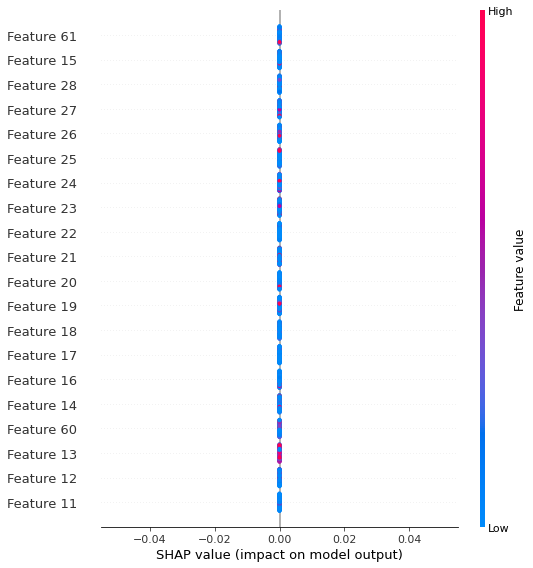

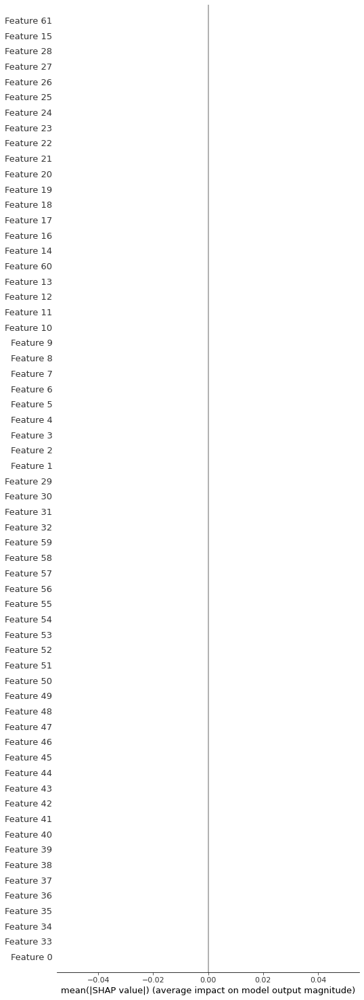

In [ ]:
shap.summary_plot(shap_values[48], np.array(X2))
shap.summary_plot(shap_values[48], np.array(X2), max_display=62, plot_type="bar")

In [ ]:
print(len(shap_values))

64


63
63
63
63


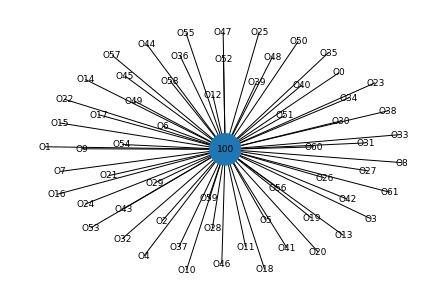

In [ ]:
e = np.argsort(np.abs(shap_values[48]).mean(0))
vals = (np.abs(shap_values[48]).mean(0))*10000
nodevals = []
import networkx as nx
G = nx.Graph()
for i in range(len(e)):
  nodevals.append("O"+str(e[i]))
G.add_nodes_from(nodevals)
G.add_node("100")
print(len(G.nodes))
node_sizes = []
labels={}
#for i in e:
#  G.add_edge(100,i)
#  node_sizes.insert(i, vals[i])
for i in range(len(G.nodes)-1):
  G.add_edge("100","O"+str(i))

#for i in range(len(nodevals)):
#  node_sizes.insert(i,vals[e[i]])
print(len(G.nodes))
index=0
for i in range(len(e)):
  node_sizes.insert(i, vals[e[i]])
  index += 1
node_sizes.insert(index, 1000)
#node_sizes.insert(100,1000)
#nx.relabel_nodes(G, labels, copy=True)
print(len(G.nodes))
print(len(node_sizes))
nx.draw(G, with_labels=True, font_size=9, node_size=node_sizes)
#nx.draw(G,)

In [ ]:
print(G.nodes)

['O0', 'O32', 'O33', 'O34', 'O36', 'O37', 'O38', 'O39', 'O40', 'O41', 'O42', 'O43', 'O44', 'O31', 'O45', 'O47', 'O48', 'O49', 'O50', 'O51', 'O52', 'O54', 'O55', 'O56', 'O57', 'O58', 'O59', 'O46', 'O60', 'O30', 'O28', 'O1', 'O2', 'O3', 'O4', 'O5', 'O6', 'O7', 'O8', 'O9', 'O10', 'O11', 'O12', 'O13', 'O29', 'O14', 'O16', 'O17', 'O18', 'O19', 'O20', 'O21', 'O22', 'O23', 'O24', 'O25', 'O26', 'O27', 'O15', 'O61', 'O53', 'O35', '100']


In [ ]:
newX = neural_net.getEncoded1(X)
newx = neural_net.getEncoded2(x)

Activation  tf.Tensor(
[[ 0.         6.496526   0.        ...  1.1157215  6.903464   0.       ]
 [ 0.         6.7825685  0.        ...  1.1544302  6.776532   0.       ]
 [ 0.         7.408287   0.        ...  1.2391051  6.4988685  0.       ]
 ...
 [ 0.         5.0564446  1.6179452 ...  3.0654547 14.025503   1.6878421]
 [ 0.         3.9625542  2.0763912 ...  3.3252068 12.160472   1.7581937]
 [ 0.         5.6821632  1.5652707 ...  3.1501298 13.74784    1.4779534]], shape=(3990, 64), dtype=float32)
Activation  tf.Tensor(
[[0.         0.         0.         ... 6.1839685  0.         6.050126  ]
 [0.         0.         0.         ... 6.4049006  0.         5.787077  ]
 [0.         0.         0.         ... 6.622809   0.         5.446129  ]
 ...
 [0.         0.         0.         ... 6.544874   0.         5.7296624 ]
 [0.         0.         0.14135781 ... 6.1425676  0.         7.695004  ]
 [0.         0.         0.         ... 7.11616    0.         6.226153  ]], shape=(97, 64), dtype=float32)


In [ ]:
print(newX)

tf.Tensor(
[[9.9789894e-01 6.8414390e-02 9.9877000e-01 ... 9.9944448e-01
  9.9999809e-01 2.6512146e-04]
 [9.9844456e-01 8.1562757e-02 9.9905407e-01 ... 9.9936956e-01
  9.9999833e-01 2.5731325e-04]
 [9.9896681e-01 8.9892864e-02 9.9949175e-01 ... 9.9923795e-01
  9.9999893e-01 2.2771955e-04]
 ...
 [9.9838841e-01 2.7345121e-03 9.0249848e-01 ... 9.9967539e-01
  1.0000000e+00 1.3648702e-05]
 [9.9851680e-01 7.0340037e-03 9.4155920e-01 ... 9.9882621e-01
  1.0000000e+00 1.7938211e-05]
 [9.9912989e-01 3.8550794e-03 9.4427717e-01 ... 9.9953097e-01
  1.0000000e+00 1.7405837e-05]], shape=(3990, 64), dtype=float32)


In [ ]:
class BasicNNModel(Model):
  def __init__(self, chanDim= 1):
    super(BasicNNModel, self).__init__()
    self.dense1 = Dense(150,input_shape=(1,8))
    self.act1A = Activation("relu")
    self.dense3 = Dense(1)
    self.act1C = Activation("sigmoid")
  def call(self, inputs):
    x = self.dense1(inputs)
    x = self.act1A(x)
    x = self.dense3(x)
    x = self.act1C(x)
    return x

In [ ]:
model = BasicNNModel()
model.compile(loss='mean_squared_error',optimizer='adam',metrics=['mse','mae','mape'])

In [ ]:
history = model.fit(newX[0:3000], Y[0:3000], epochs=1000, validation_data=(newX[3000:3900], Y[3000:3900]), verbose=2)

Epoch 1/1000
94/94 - 1s - loss: 18.1557 - mse: 18.1557 - mae: 4.1316 - mape: 80.2252 - val_loss: 14.3007 - val_mse: 14.3007 - val_mae: 3.6953 - val_mape: 78.1477 - 875ms/epoch - 9ms/step
Epoch 2/1000
94/94 - 0s - loss: 17.9423 - mse: 17.9423 - mae: 4.1061 - mape: 79.7021 - val_loss: 14.2984 - val_mse: 14.2984 - val_mae: 3.6950 - val_mape: 78.1406 - 287ms/epoch - 3ms/step
Epoch 3/1000
94/94 - 0s - loss: 17.9408 - mse: 17.9408 - mae: 4.1060 - mape: 79.6987 - val_loss: 14.2977 - val_mse: 14.2977 - val_mae: 3.6949 - val_mape: 78.1386 - 236ms/epoch - 3ms/step
Epoch 4/1000
94/94 - 0s - loss: 17.9404 - mse: 17.9404 - mae: 4.1059 - mape: 79.6975 - val_loss: 14.2974 - val_mse: 14.2974 - val_mae: 3.6949 - val_mape: 78.1379 - 218ms/epoch - 2ms/step
Epoch 5/1000
94/94 - 0s - loss: 17.9402 - mse: 17.9402 - mae: 4.1059 - mape: 79.6970 - val_loss: 14.2973 - val_mse: 14.2973 - val_mae: 3.6949 - val_mape: 78.1375 - 242ms/epoch - 3ms/step
Epoch 6/1000
94/94 - 0s - loss: 17.9401 - mse: 17.9401 - mae: 4.1

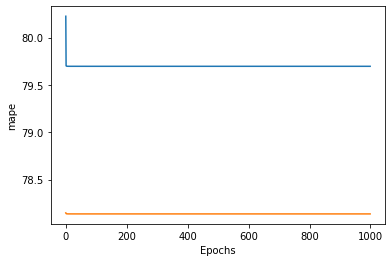

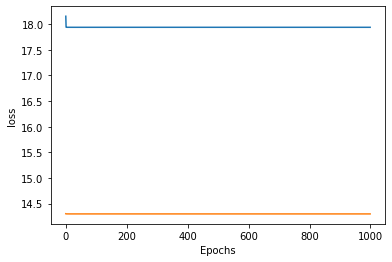

In [ ]:
import matplotlib.pyplot as plt


def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  #plt.legend([string, 'val_'+string])
  plt.show()

plot_graphs(history, "mape")
plot_graphs(history, "loss")

In [ ]:
history

In [ ]:
results = model.evaluate(newx, y, batch_size=10)
print("test loss, test acc:", results)

In [ ]:
print(newx)

In [ ]:
class TransferModel(Model):
  def __init__(self, chanDim= 1):
    super(TransferModel, self).__init__()
    self.dense1 = Dense(150)
    self.act1B = Activation("relu")
    self.dense3 = Dense(1)
    self.act1C = Activation("sigmoid")
  def call(self, inputs):
    x = self.dense1(inputs)
    x = self.act1A(x)
    x = self.dense3(x)
    x = self.act1C(x)
    return x

In [ ]:
model2 = TransferModel()
model2.compile(loss='mean_squared_error',optimizer='adam',metrics=['mse','mae','mape'])

In [ ]:
#model2.layers[5].set_weights(model.layers[5].get_weights())
model2.layers[3].set_weights(model.layers[3].get_weights())
#model2.layers[5].trainable= False
model2.layers[3].trainable= False

In [ ]:
results = model2.evaluate(newx, y, batch_size=10)
print("test loss, test acc:", results)

In [ ]:
LengthofFOlds = np.zeros(10)
FoldIndexArrayX = np.zeros(((10,10,64)))
FoldIndexArrayY = np.zeros(((10,10,4)))

In [ ]:
from sklearn.model_selection import KFold
kfold = KFold(n_splits= 10, shuffle=False)
mse_per_fold = []
mae_per_fold = []
loss_per_fold = []
fold_no = 1
for train, test in kfold.split(newx, y):
  rowx = tf.gather(newx, train)
  rowy = tf.gather(y, train)
  """history = model.fit(rowx, rowy,
              batch_size=5,
              epochs=2,
              verbose=2)"""
  tx = tf.gather(newx, test)
  ty = tf.gather(y, test)
  LengthofFOlds[fold_no-1] = len(tx)
  #print(len(tx))
  #print(tx.shape)
  for j in range(len(tx)):
    for k in range(len(tx[j])):
      #print("j ",j, " k", k)
      FoldIndexArrayX[fold_no-1][j][k]=tx[j][k]
    FoldIndexArrayY[fold_no-1][j]=ty[j]
  scores = model.evaluate(tx, ty, verbose=2)
  print(f'Score for fold {fold_no}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]*100}%')

  loss_per_fold.append(scores[0])
  mse_per_fold.append(scores[1])
  mae_per_fold.append(scores[2])

  # Increase fold number
  #print("Train ",train, " AND Test", test)
  fold_no = fold_no + 1



1/1 - 0s - loss: 14.0221 - mse: 14.0221 - mae: 3.7433 - mape: 78.9084 - 177ms/epoch - 177ms/step
Score for fold 1: loss of 14.022104263305664; mse of 1402.2104263305664%
1/1 - 0s - loss: 14.5867 - mse: 14.5867 - mae: 3.8159 - mape: 79.2126 - 23ms/epoch - 23ms/step
Score for fold 2: loss of 14.586725234985352; mse of 1458.6725234985352%
1/1 - 0s - loss: 14.9105 - mse: 14.9105 - mae: 3.8564 - mape: 79.3748 - 20ms/epoch - 20ms/step
Score for fold 3: loss of 14.910548210144043; mse of 1491.0548210144043%
1/1 - 0s - loss: 17.2319 - mse: 17.2319 - mae: 4.1171 - mape: 80.2599 - 19ms/epoch - 19ms/step
Score for fold 4: loss of 17.231868743896484; mse of 1723.1868743896484%
1/1 - 0s - loss: 18.1348 - mse: 18.1348 - mae: 4.2156 - mape: 80.5816 - 19ms/epoch - 19ms/step
Score for fold 5: loss of 18.1347599029541; mse of 1813.4759902954102%
1/1 - 0s - loss: 13.5220 - mse: 13.5220 - mae: 3.6771 - mape: 78.6188 - 22ms/epoch - 22ms/step
Score for fold 6: loss of 13.522013664245605; mse of 1352.2013664

In [ ]:
print(mae_per_fold)

[3.7432799339294434, 3.815887928009033, 3.8563950061798096, 4.117114543914795, 4.215558052062988, 3.677140712738037, 5.215489864349365, 3.910963773727417, 3.688894033432007, 3.6880722045898438]


  0%|          | 0/10 [00:00<?, ?it/s]

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight

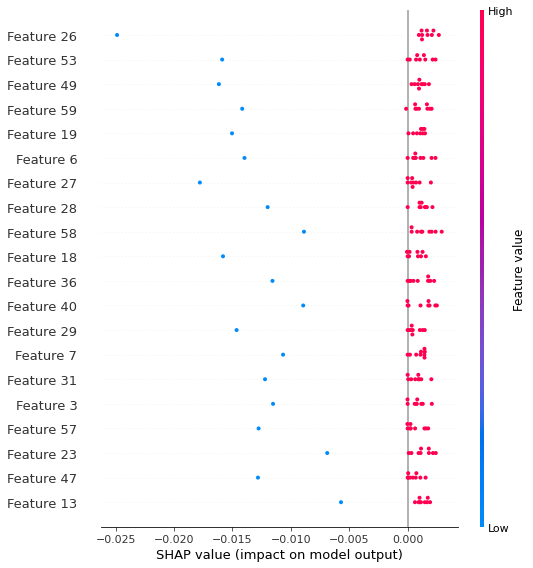

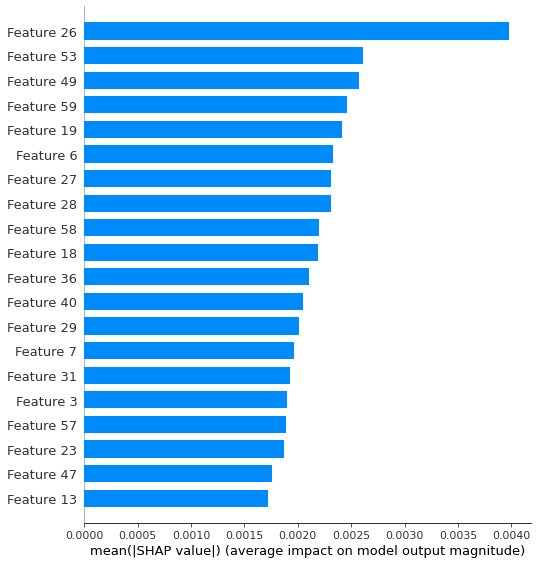

In [ ]:
X2 = FoldIndexArrayX[8]
explainer1 = shap.KernelExplainer(model.predict, np.array(X2))

# Extract Shapley values from the explainer
shap_values1 = explainer1.shap_values(np.array(X2))
shap.summary_plot(shap_values1[0], np.array(X2))
shap.summary_plot(shap_values1[0], np.array(X2), plot_type="bar")

[16 44 10 14 63 12  1 56  2 38  9 52 34  4 15  8 17 33 54 37 21 60 35  5
 25 55  0 46 11 61 24 30 43 41 39 42 50 20 48 45 22 51 32 62 13 47 23 57
  3 31  7 29 40 36 18 58 28 27  6 19 59 49 53 26]
[ 8.46906885  2.06452043  2.31961991 19.02035872  3.57263304  6.5206332
 23.25469844 19.63253791  3.65469797  2.72501474  1.43783898  8.7555554
  1.71982358 17.23569303  1.47552567  3.65414573  1.21481085  4.23161673
 21.86575468 24.12201657 14.12121384  5.07101549 14.7532355  18.70912197
 10.48763689  6.59404465 39.81983173 23.12760506 23.11602575 20.08213565
 10.66811532 19.24509521 15.24737136  4.30958328  3.56671069  6.2461273
 21.07315707  4.9328476   2.64890629 13.44843724 20.44245494 12.42877927
 13.68293676 11.32651311  1.3156969  14.53266925  8.67668287 17.60341181
 14.51059538 25.72697219 13.72872319 14.76886215  3.06561708 26.076021
  4.59820822  7.58370579  2.13908259 18.9315812  22.00666577 24.64149564
  6.22856417  9.85240444 17.01348113  1.58984853]
[16, 44, 10, 14, 63, 12, 1, 5

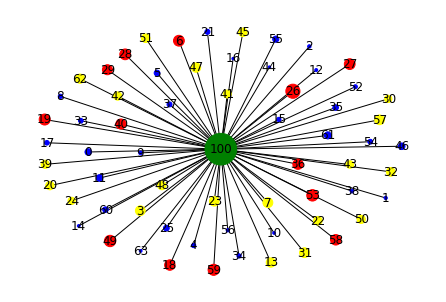

In [ ]:
e1 = np.argsort(np.abs(shap_values1[0]).mean(0))
print(e1)
vals1 = (np.abs(shap_values1[0]).mean(0))*50000
vals2 = (np.abs(shap_values1[0]).mean(0))*10000
print(vals2)
G2 = nx.Graph()
G2.add_nodes_from(e1)
G2.add_node(100)


node_sizes2 = []
color_map = []
j=0
for j in e1:
  if vals2[j] >= 20:
    color_map.append('red')
  elif vals2[j]>=10:
    color_map.append('yellow')
  else:
    color_map.append('blue')


print(G2.nodes)
for i in e1:
  G2.add_edge(100,i)
for i in range(len(e1)):
  node_sizes2.insert(i, vals1[e1[i]])


node_sizes2.insert(100, 1000)
color_map.append('green')


nx.draw(G2, with_labels=True, node_color=color_map, node_size=node_sizes2)
print("Vals1")
print(vals1)
print("Vals2")
print(vals2)

65
4033
4033
4033


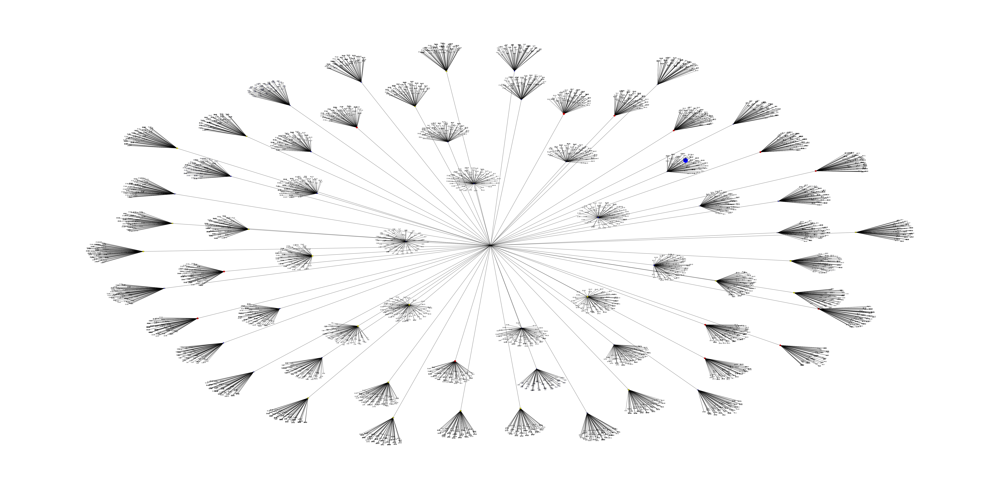

In [ ]:
G3 = nx.Graph()
nodevals4 =[]
node_sizes3 = []
color_map3 = []
for i in range(len(e1)):
  nodevals4.append("S"+str(e1[i]))
G3.add_nodes_from(nodevals4)
G3.add_node("P")
print(len(G3.nodes))

for i in range(len(e1)):
  G3.add_edge("P","S"+str(i))

for j in e1:
  if vals2[j] >= 20:
    color_map3.append('red')
  elif vals2[j]>=10:
    color_map3.append('yellow')
  else:
    color_map3.append('blue')
color_map3.append('green')

index=0
for i in range(len(e1)):
  node_sizes3.insert(index, vals1[e1[i]])
  index += 1

######graph for output finished
nodevals3 = []

labels3={}

for i in range(64):
  e3 = np.argsort(np.abs(shap_values[i]).mean(0))
  vals3 = (np.abs(shap_values[i]).mean(0))*1000
  for j in range(len(e3)):
    nodevals3.append(str(i)+"-"+str(e3[j]))
  for j in range(len(e3)):
    node_sizes3.insert(index, vals3[e3[j]])
    index += 1
  for j in range(len(e3)):
    G3.add_edge("S"+str(i),str(i)+"-"+str(e[j]))
  for j in e3:
    if vals3[j] >= 20:
      color_map3.append('red')
    elif vals3[j]>=10:
      color_map3.append('yellow')
    else:
      color_map3.append('blue')
  #print(len(color_map3))

G3.add_nodes_from(nodevals3)
print(len(G3.nodes))

node_sizes3.insert(index, 1000)
print(len(G3.nodes))

print(len(node_sizes3))
fig, ax = plt.subplots(figsize=(128,64))
nx.draw(G3, with_labels=True, font_size=9, node_color=color_map3, node_size=node_sizes3)
#nx.draw(G,)

In [ ]:
F=nx.Graph()
F.a

128


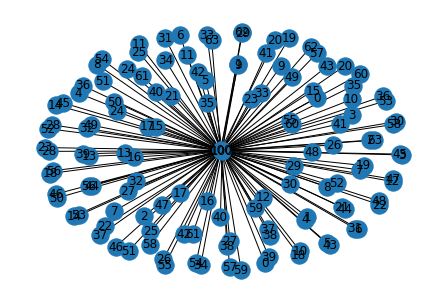

In [ ]:
F = nx.compose(F,G)
nx.draw(F, with_labels=True)
F = nx.compose(F,G2)
nx.draw(F, with_labels=True)


In [ ]:
print(e1)

[17  5 42 49 13 43 63 56  8 22  1 31 30 15 19  9 25  4 50 51 34 18 37 57
 39 21 53 52  7 26 47 62 33 54 29  3 40 35 28 59 27 10 16 38 11 61 14 58
 36  0 24 23 32 41  6 55 60 45 46 44 20  2 12 48]


In [ ]:
print(len(e1))

64


In [ ]:

from fa2 import ForceAtlas2


#G = nx.random_geometric_graph(400, 0.2)

forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=2.0,
                        strongGravityMode=False,
                        gravity=1.0,

                        # Log
                        verbose=True)

100%|██████████| 2000/2000 [00:00<00:00, 6427.83it/s]


BarnesHut Approximation  took  0.09  seconds
Repulsion forces  took  0.13  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


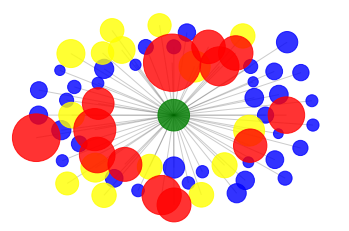

ModuleNotFoundError: ignored

In [ ]:
positions = forceatlas2.forceatlas2_networkx_layout(G2, pos=None, iterations=2000)
nx.draw_networkx_nodes(G2, positions, node_size= node_sizes2, node_color=color_map, alpha=0.8, label=e1)
#nx.draw_networkx_nodes()
nx.draw_networkx_edges(G2, positions, edge_color="black", alpha=0.2)
plt.axis('off')
plt.show()

# equivalently
import igraph
G = igraph.Graph.TupleList(G.edges(), directed=False)
layout = forceatlas2.forceatlas2_igraph_layout(G, pos=None, iterations=2000)
igraph.plot(G, layout).show()